<a href="https://colab.research.google.com/github/lorenzo-arcioni/Computer-Science-Sapienza/blob/main/Computer Vision/results_eda.ipynb" target="_blank"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Questa cella esegue il login su wandb

In [1]:
import wandb
from wandb import Api
import pandas as pd
import os
import shutil

# === CONFIGURAZIONE ===
sweeps_mapping = {
    "7ovklbta" : "YOLOv11s", # Sweep Bayesian
    "4q1q0ld1" : "YOLOv11s", # Sweep with the initial run
    "7e7521i8": "YOLOv11n",  # Sweep Bayesian
    "so0hcj67": "YOLOv11n",  # Sweep with the initial run 

}

ENTITY = "pothole-detector"
PROJECT = "pothole-detector-NatureSR"

# === LOGIN ===
wandb.login()

# === SETUP ===
api = Api()

wandb: Currently logged in as: lorenzo-arcioni to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


## Download dei dati da wandb

In [ ]:
import os
import shutil
import wandb

# === ESTRAZIONE DEI DATI ===
all_runs_data = []

summary_useful = [
    'lr/pg0', 
    'lr/pg1', 
    'lr/pg2', 
    'metrics/mAP50(B)', 
    'metrics/mAP50-95(B)', 
    'metrics/precision(B)', 
    'metrics/recall(B)', 
    'model/GFLOPs', 
    'model/parameters', 
    'model/speed_PyTorch(ms)', 
    'train/box_loss', 
    'train/cls_loss', 
    'train/dfl_loss',
    'val/box_loss',
    'val/cls_loss', 
    'val/dfl_loss',
]

# === CICLO SU TUTTI GLI SWEEP ===
OUTPUT_DIR = {sweep_id: f"results/{name}" for sweep_id, name in sweeps_mapping.items()}
CONFIG_DIR = "configs"
os.makedirs(CONFIG_DIR, exist_ok=True)

for sweep_id in sweeps_mapping:
    out_dir = OUTPUT_DIR[sweep_id]
    os.makedirs(out_dir, exist_ok=True)
    print(f"\n📦 Sweep {sweep_id} → output in '{out_dir}'")
    
    try:
        sweep = api.sweep(f"{ENTITY}/{PROJECT}/{sweep_id}")
        runs = sweep.runs
        print(f"🔍 Trovati {len(runs)} run")
        
        for run in runs:
            run_id = run.id
            run_name = run.name or run_id
            found_files = []
            
            print(f"🔄 Analizzo run: {run_name}")
            
            # === Scarica anche il config.yaml del run ===
            try:
                files = run.files()
                if "config.yaml" in [f.name for f in files]:
                    config_file = run.file("config.yaml")
                    config_path = os.path.join(CONFIG_DIR, f"{run_name}_{run_id}_config.yaml")
                    config_file.download(CONFIG_DIR, replace=True)
                    # rinomina se serve
                    downloaded_path = os.path.join(CONFIG_DIR, "config.yaml")
                    if os.path.exists(downloaded_path):
                        os.rename(downloaded_path, config_path)
                    print(f"   ⚙️ Config salvato: {config_path}")
                else:
                    print("   ⚠️ Nessun config.yaml trovato per questo run")
            except Exception as e:
                print(f"   ❌ Errore scaricando config.yaml: {e}")
                exit(0)
            
            # === Elenco artifacts come prima ===
            artifacts = run.logged_artifacts()
            print(f"   📁 Trovati {len(artifacts)} artifacts")
            
            for artifact in artifacts:
                if not artifact.name.split(':')[0].endswith('_log'):
                    continue
                    
                print(f"   🔍 Controllo artifact: {artifact.name}")
                
                try:
                    artifact_dir = artifact.download()
                    print(f"   ⬇️ Scaricato in: {artifact_dir}")
                    
                    for root, dirs, files in os.walk(artifact_dir):
                        for file in files:
                            if file == "results.csv":
                                results_path = os.path.join(root, file)
                                artifact_name_clean = artifact.name.replace(":", "_").replace("/", "_")
                                output_filename = f"{run_name}_{run_id}_{artifact_name_clean}_results.csv"
                                output_path = os.path.join(out_dir, output_filename)
                                
                                shutil.copy(results_path, output_path)
                                print(f"   ✅ Salvato: {output_path}")
                                found_files.append(output_path)
                                
                except Exception as e:
                    print(f"   ❌ Errore scaricando artifact {artifact.name}: {e}")
            
            if not found_files:
                print("   ⚠️ Nessun 'results.csv' trovato in nessun artifact.")
            else:
                print(f"   🎉 Trovati {len(found_files)} file results.csv")
                
    except Exception as e:
        print(f"❌ Errore nello sweep {sweep_id}: {e}")

print("\n🏁 Download completato!")

## Loading dei dati in un DataFrame

In [1]:
import pandas as pd
import numpy as np
import os
import re
import yaml
from pathlib import Path

def load_config_file(config_path):
    """
    Carica un file di configurazione YAML.
    
    Args:
        config_path: Percorso al file di configurazione
    
    Returns:
        dict: Dizionario con le configurazioni
    """
    try:
        with open(config_path, 'r') as file:
            config = yaml.safe_load(file)
            return config
    except Exception as e:
        print(f"   ⚠️ Errore caricando config {config_path}: {e}")
        return {}

def find_config_file(run_code, configs_directory="configs"):
    """
    Trova il file di configurazione corrispondente a un run_code.
    
    Args:
        run_code: Codice del run (es. vo45708b)
        configs_directory: Directory contenente i config files
    
    Returns:
        str or None: Percorso al file di configurazione se trovato
    """
    if not os.path.exists(configs_directory):
        return None
        
    # Cerca file che contengono il run_code
    for config_file in os.listdir(configs_directory):
        if config_file.endswith('.yaml') and run_code in config_file:
            return os.path.join(configs_directory, config_file)
    
    return None

def extract_config_info(config_data):
    """
    Estrae le informazioni rilevanti dal config file.
    
    Args:
        config_data: Dizionario con i dati di configurazione
    
    Returns:
        dict: Dizionario con le informazioni estratte
    """
    config_info = {
        'batch_size': None,
        'dropout': None,
        'lr0': None,
        'lrf': None,
        'momentum': None,
        'optimizer': None,
        'weight_decay': None
    }
    
    if not config_data:
        return config_info
    
    # Funzione helper per estrarre valore dalla struttura {key: {value: actual_value}}
    def get_value(data, key):
        if key in data:
            if isinstance(data[key], dict) and 'value' in data[key]:
                return data[key]['value']
            else:
                return data[key]
        return None
    
    # Estrai le informazioni dalla struttura YAML con 'value'
    config_info['batch_size'] = get_value(config_data, 'batch')
    config_info['dropout'] = get_value(config_data, 'dropout')
    config_info['lr0'] = get_value(config_data, 'lr0')
    config_info['lrf'] = get_value(config_data, 'lrf')
    config_info['momentum'] = get_value(config_data, 'momentum')
    config_info['optimizer'] = get_value(config_data, 'optimizer')
    config_info['weight_decay'] = get_value(config_data, 'weight_decay')
    
    return config_info

def load_all_results_to_dataframe(base_directory="results", configs_directory="configs"):
    """
    Carica tutti i CSV dai risultati degli sweep in un singolo DataFrame,
    includendo le informazioni dai config files.
    
    Args:
        base_directory: Directory base contenente le cartelle dei modelli
        configs_directory: Directory contenente i config files YAML
    
    Returns:
        pandas.DataFrame: DataFrame combinato con tutti i risultati e configurazioni
    """
    
    all_data = []
    config_data_list = []  # Lista per i dati di configurazione
    
    # Scorri tutte le directory dei modelli
    for model_dir in os.listdir(base_directory):
        model_path = os.path.join(base_directory, model_dir)
        
        if not os.path.isdir(model_path):
            continue
            
        print(f"🔍 Processando modello: {model_dir}")
        
        # Scorri tutti i file CSV nella directory del modello
        csv_files = [f for f in os.listdir(model_path) if f.endswith('.csv')]
        print(f"   📁 Trovati {len(csv_files)} file CSV")
        
        for csv_file in csv_files:
            # Estrai informazioni dal nome del file
            # Formato: nome-sweep-X_codice_foldY_log_vZ_results.csv
            match = re.match(r'(.+?)_([a-z0-9]+)_(fold\d+)_log_v\d+_results\.csv', csv_file)
            
            if not match:
                print(f"   ⚠️ Formato nome file non riconosciuto: {csv_file}")
                continue
                
            run_name = match.group(1)
            run_code = match.group(2)
            fold = match.group(3)
            
            # Carica il CSV
            csv_path = os.path.join(model_path, csv_file)
            try:
                df = pd.read_csv(csv_path)
                
                # Aggiungi le colonne identificative
                df['model'] = model_dir
                df['run_name'] = run_name
                df['run_code'] = run_code
                df['fold'] = fold
                df['fold_number'] = int(fold.replace('fold', ''))
                
                # Aggiungi alla lista
                all_data.append(df)
                
                print(f"   ✅ Caricato: {csv_file} ({len(df)} righe)")
                
            except Exception as e:
                print(f"   ❌ Errore caricando {csv_file}: {e}")
    
    if not all_data:
        print("❌ Nessun dato trovato!")
        return pd.DataFrame()
    
    # Combina tutti i DataFrame
    combined_df = pd.concat(all_data, ignore_index=True)
    
    # Ora carica le configurazioni e crea un DataFrame separato
    print(f"\n🔧 Caricando configurazioni...")
    unique_run_codes = combined_df['run_code'].unique()
    
    for run_code in unique_run_codes:
        config_file_path = find_config_file(run_code, configs_directory)
        if config_file_path:
            print(f"   🔧 Trovato config per {run_code}: {os.path.basename(config_file_path)}")
            config_data = load_config_file(config_file_path)
            config_info = extract_config_info(config_data)
            config_info['run_code'] = run_code  # Aggiungi la chiave per il join
            config_data_list.append(config_info)
        else:
            print(f"   ⚠️ Config non trovato per run_code: {run_code}")
            # Crea una configurazione vuota
            empty_config = extract_config_info({})
            empty_config['run_code'] = run_code
            config_data_list.append(empty_config)
    
    # Crea DataFrame delle configurazioni
    if config_data_list:
        config_df = pd.DataFrame(config_data_list)
        
        # Fai il merge con il DataFrame principale
        combined_df = combined_df.merge(config_df, on='run_code', how='left')
        
        # Riordina le colonne mettendo le identificative e di config all'inizio
        id_columns = ['model', 'run_name', 'run_code', 'fold', 'fold_number']
        config_columns = ['batch_size', 'dropout', 'lr0', 'lrf', 'momentum', 'optimizer', 'weight_decay']
        other_columns = [col for col in combined_df.columns if col not in id_columns + config_columns]
        combined_df = combined_df[id_columns + config_columns + other_columns]
    
    print(f"\n🎉 DataFrame combinato creato!")
    print(f"   📊 Totale righe: {len(combined_df)}")
    print(f"   📈 Modelli: {combined_df['model'].nunique()}")
    print(f"   🏃 Run unici: {combined_df['run_code'].nunique()}")
    print(f"   📂 Fold: {sorted(combined_df['fold'].unique())}")
    print(f"   🔧 Config caricati: {len(config_data_list)}")
    
    return combined_df

def get_summary_statistics(df):
    """
    Genera statistiche riassuntive del dataset.
    
    Args:
        df: DataFrame combinato
    
    Returns:
        dict: Dizionario con statistiche
    """
    
    summary = {
        'total_rows': len(df),
        'total_models': df['model'].nunique(),
        'total_runs': df['run_code'].nunique(),
        'models_list': df['model'].unique().tolist(),
        'runs_per_model': df.groupby('model')['run_code'].nunique().to_dict(),
        'epochs_per_run_fold': df.groupby(['run_code', 'fold'])['epoch'].count().describe(),
        'max_epochs': df.groupby(['run_code', 'fold'])['epoch'].max().describe()
    }
    
    # Aggiungi statistiche sui config
    config_columns = ['batch_size', 'dropout', 'lr0', 'lrf', 'momentum', 'optimizer', 'weight_decay']
    for col in config_columns:
        if col in df.columns:
            summary[f'{col}_unique_values'] = df[col].nunique()
            summary[f'{col}_missing'] = df[col].isnull().sum()
    
    return summary

def show_config_summary(df):
    """
    Mostra un riassunto delle configurazioni caricate.
    
    Args:
        df: DataFrame combinato
    """
    config_columns = ['batch_size', 'dropout', 'lr0', 'lrf', 'momentum', 'optimizer', 'weight_decay']
    
    print(f"\n🔧 Riassunto Configurazioni:")
    for col in config_columns:
        if col in df.columns:
            unique_values = df[col].dropna().unique()
            missing_count = df[col].isnull().sum()
            print(f"   {col}:")
            print(f"      Valori unici: {len(unique_values)} ({list(unique_values)[:5]}{'...' if len(unique_values) > 5 else ''})")
            print(f"      Valori mancanti: {missing_count}/{len(df)} ({missing_count/len(df)*100:.1f}%)")

# Esempio di utilizzo
if __name__ == "__main__":
    # Carica tutti i dati
    df = load_all_results_to_dataframe("results", "configs")
    
    if not df.empty:
        # Mostra informazioni base
        print(f"\n📋 Struttura DataFrame:")
        print(f"   Shape: {df.shape}")
        print(f"   Colonne: {list(df.columns)}")
        
        # Mostra riassunto configurazioni
        show_config_summary(df)
        
        # Mostra alcuni esempi
        print(f"\n🔍 Prime 5 righe:")
        print(df.head())

        # Statistiche riassuntive
        print(f"\n📊 Statistiche per modello:")
        print(df.groupby(['model', 'run_name', 'fold']).size().head(10))
        
        # Salva il DataFrame combinato
        output_path = "combined_results_with_configs.csv"
        df.to_csv(output_path, index=False)
        print(f"\n💾 DataFrame salvato in: {output_path}")
        
        # Genera statistiche
        stats = get_summary_statistics(df)
        print(f"\n📈 Statistiche riassuntive:")
        for key, value in stats.items():
            if key not in ['epochs_per_run_fold', 'max_epochs']:
                print(f"   {key}: {value}")

🔍 Processando modello: YOLOv8n
   📁 Trovati 0 file CSV
🔍 Processando modello: MobileNetv3-SSD320
   📁 Trovati 0 file CSV
🔍 Processando modello: YOLOv11s
   📁 Trovati 240 file CSV
   ✅ Caricato: celestial-sweep-37_yzna6anl_fold0_log_v137_results.csv (79 righe)
   ✅ Caricato: frosty-sweep-60_vo45708b_fold0_log_v159_results.csv (63 righe)
   ✅ Caricato: dutiful-sweep-39_qgpy2wrg_fold2_log_v142_results.csv (77 righe)
   ✅ Caricato: eternal-sweep-31_4seovufw_fold2_log_v134_results.csv (80 righe)
   ✅ Caricato: polished-sweep-16_bfw8nbe4_fold1_log_v118_results.csv (93 righe)
   ✅ Caricato: morning-sweep-43_ubs0gihx_fold1_log_v145_results.csv (75 righe)
   ✅ Caricato: stoic-sweep-20_2lp7qswl_fold2_log_v123_results.csv (77 righe)
   ✅ Caricato: peach-sweep-34_8d6gcev0_fold2_log_v137_results.csv (40 righe)
   ✅ Caricato: restful-sweep-30_y98lod68_fold1_log_v132_results.csv (74 righe)
   ✅ Caricato: feasible-sweep-13_srv4z7sp_fold2_log_v116_results.csv (75 righe)
   ✅ Caricato: smart-sweep-4_wk2

In [2]:
# Mostra tutte le righe
pd.set_option("display.max_rows", 1000)

# Mostra tutte le colonne
pd.set_option("display.max_columns", 27)

df["time"]

0          40.6471
1          79.9075
2         117.5560
3         157.7070
4         194.9890
           ...    
34672    2294.9900
34673    2313.6700
34674    2332.3500
34675    2351.4400
34676    2370.2300
Name: time, Length: 34677, dtype: float64

In [3]:
df.columns

Index(['model', 'run_name', 'run_code', 'fold', 'fold_number', 'batch_size',
       'dropout', 'lr0', 'lrf', 'momentum', 'optimizer', 'weight_decay',
       'epoch', 'time', 'train/box_loss', 'train/cls_loss', 'train/dfl_loss',
       'metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)',
       'metrics/mAP50-95(B)', 'val/box_loss', 'val/cls_loss', 'val/dfl_loss',
       'lr/pg0', 'lr/pg1', 'lr/pg2'],
      dtype='object')

In [4]:
df.head()

,model,run_name,run_code,fold,fold_number,batch_size,dropout,lr0,lrf,momentum,optimizer,weight_decay,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,YOLOv11s,celestial-sweep-37,yzna6anl,fold0,0,16,0.202726,0.003023,0.037171,0.454304,auto,0.002435,1,40.6471,2.41953,3.62372,1.85209,0.28003,0.33581,0.24089,0.09308,2.31746,2.70315,1.86615,0.000471,0.000471,0.000471
1,YOLOv11s,celestial-sweep-37,yzna6anl,fold0,0,16,0.202726,0.003023,0.037171,0.454304,auto,0.002435,2,79.9075,2.34299,2.51042,1.79389,0.16645,0.19447,0.14005,0.05742,2.43775,32.95540,2.08837,0.000939,0.000939,0.000939
2,YOLOv11s,celestial-sweep-37,yzna6anl,fold0,0,16,0.202726,0.003023,0.037171,0.454304,auto,0.002435,3,117.5560,2.35795,2.46417,1.79652,0.25922,0.32022,0.20727,0.08388,2.47285,3.42500,2.04648,0.001397,0.001397,0.001397
3,YOLOv11s,celestial-sweep-37,yzna6anl,fold0,0,16,0.202726,0.003023,0.037171,0.454304,auto,0.002435,4,157.7070,2.31951,2.37628,1.79275,0.32313,0.29758,0.23116,0.08984,2.40032,2.52221,1.87071,0.001388,0.001388,0.001388
4,YOLOv11s,celestial-sweep-37,yzna6anl,fold0,0,16,0.202726,0.003023,0.037171,0.454304,auto,0.002435,5,194.9890,2.26879,2.30996,1.76410,0.31751,0.33333,0.28080,0.11132,2.31447,2.29621,1.80913,0.001374,0.001374,0.001374


### Preprocessing

In [5]:
def replace_inf_with_local_mean(df, cols):
    """
    Sostituisce valori inf o -inf in un dataframe con la media dei vicini (precedente e successivo).
    Se il vicino non esiste, copia il valore disponibile.
    
    Args:
        df (pd.DataFrame): dataframe da processare
        cols (list): colonne da trattare
    Returns:
        df aggiornato
    """
    df = df.copy()
    
    for col in cols:
        if col not in df.columns:
            continue

        # Trova valori inf/-inf
        mask_inf = df[col].isin([np.inf, -np.inf])
        inf_indices = np.where(mask_inf)[0]

        for idx in inf_indices:
            prev_val = df[col].iloc[idx-1] if idx > 0 else np.nan
            next_val = df[col].iloc[idx+1] if idx < len(df[col])-1 else np.nan

            # Scegli la media dei vicini se entrambi validi, altrimenti il valore disponibile
            neighbors = [v for v in [prev_val, next_val] if pd.notna(v) and not np.isinf(v)]
            if neighbors:
                df.at[idx, col] = np.mean(neighbors)
            else:
                # se nessun vicino valido, sostituisci con 0
                df.at[idx, col] = 0

    return df

# === Normalizzazione epoche per run e fold ===
df['normalized_epoch'] = df.groupby(['run_code', 'fold'])['epoch'].transform(
    lambda x: (x - x.min()) / (x.max() - x.min()) if x.max() > x.min() else 0
)

# === Tempo di training effettivo per epoca ===
df['training_time'] = df.groupby(['run_code', 'fold'])['time'].diff().fillna(df['time'])

# === F1-score se non presente ===
if 'metrics/f1(B)' not in df.columns:
    df['metrics/f1(B)'] = 2 * (df['metrics/precision(B)'].astype(float) * df['metrics/recall(B)'].astype(float)) / \
                              (df['metrics/precision(B)'].astype(float) + df['metrics/recall(B)'].astype(float) + 1e-8)

# === Tutte le colonne di loss da processare ===
loss_cols = [c for c in df.columns if 'loss' in c]

# Sostituisci eventuali valori inf nelle loss
df = replace_inf_with_local_mean(df, loss_cols)

# Define key metrics
key_metrics = [metric for metric in df.columns if metric.startswith('metrics/')]
models = list(df.model.unique())
optimizers = list(df.optimizer.unique())

## Analisi esplorativa dei dati degli sweeps

In [87]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D
from scipy.stats import gaussian_kde
import seaborn as sns

COLORS = {
    "gray": "#363636",
    "blue": "#406c80",
    "orange": "#cf8532",
    "red": "#c94c4c",
    "green": "#6B9968",
    "purple": "#786797"
}

def print_color(text, color="green"):
    colors = {
        "green": "\033[92m",
        "red": "\033[91m",
        "blue": "\033[94m",
        "yellow": "\033[93m"
    }
    print(f"{colors.get(color, '')}{text}\033[0m")

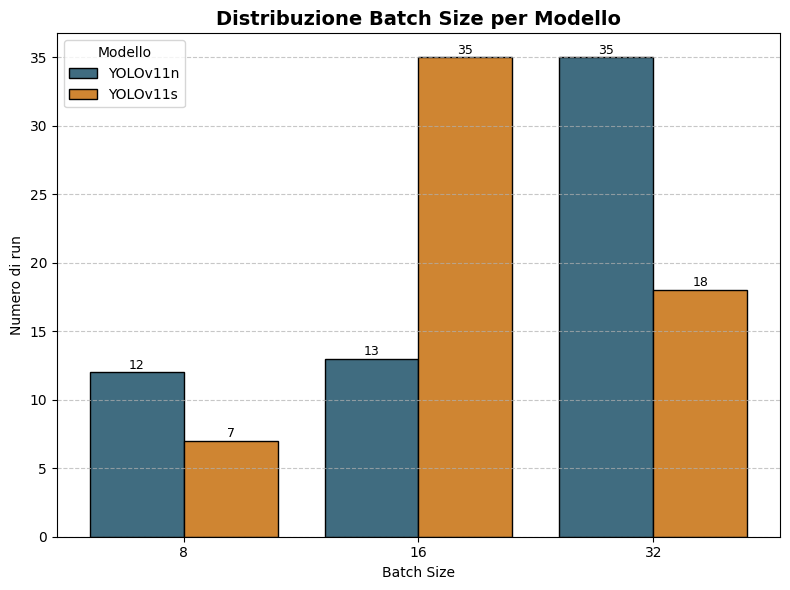

In [7]:
def plot_batch_distribution_bar_multiple(df):
    """
    Mostra la distribuzione di 'batch_size' come diagramma a barre multiple,
    una barra per modello per ogni batch size, con numero di run sopra ogni barra.

    Args:
        df (pd.DataFrame): deve contenere ['run_code', 'model', 'batch_size']
    """
    # Prendi ultimo valore di batch per ogni run
    run_batch = df.groupby(["run_code", "model"], as_index=False)["batch_size"].last()

    # Lista batch size unici ordinati
    batch_sizes = sorted(run_batch["batch_size"].unique())
    models = run_batch["model"].unique()
    n_models = len(models)
    x = range(len(batch_sizes))
    width = 0.8 / n_models  # larghezza barre affiancate

    fig, ax = plt.subplots(figsize=(8, 6))

    # Colori ciclici per modelli
    color_list = [COLORS["blue"], COLORS["orange"], COLORS["red"], COLORS["green"], COLORS["gray"]]
    
    for i, model in enumerate(models):
        model_data = run_batch[run_batch["model"] == model]
        counts = model_data["batch_size"].value_counts().reindex(batch_sizes, fill_value=0)

        bars = ax.bar(
            [pos + i*width for pos in x],
            counts.values,
            width=width,
            color=color_list[i % len(color_list)],
            edgecolor="black",
            label=model
        )

        # Numeri sopra le barre
        for bar in bars:
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2, height + 0.05, f"{int(height)}",
                    ha="center", va="bottom", fontsize=9)

    # Etichette asse X centrate
    ax.set_xticks([pos + width*(n_models/2 - 0.5) for pos in x])
    ax.set_xticklabels(batch_sizes)
    ax.set_xlabel("Batch Size")
    ax.set_ylabel("Numero di run")
    ax.set_title("Distribuzione Batch Size per Modello", fontsize=14, fontweight="bold")
    ax.grid(axis="y", linestyle="--", alpha=0.7)
    ax.legend(title="Modello")

    plt.tight_layout()
    plt.show()

# --- Uso ---
plot_batch_distribution_bar_multiple(df)

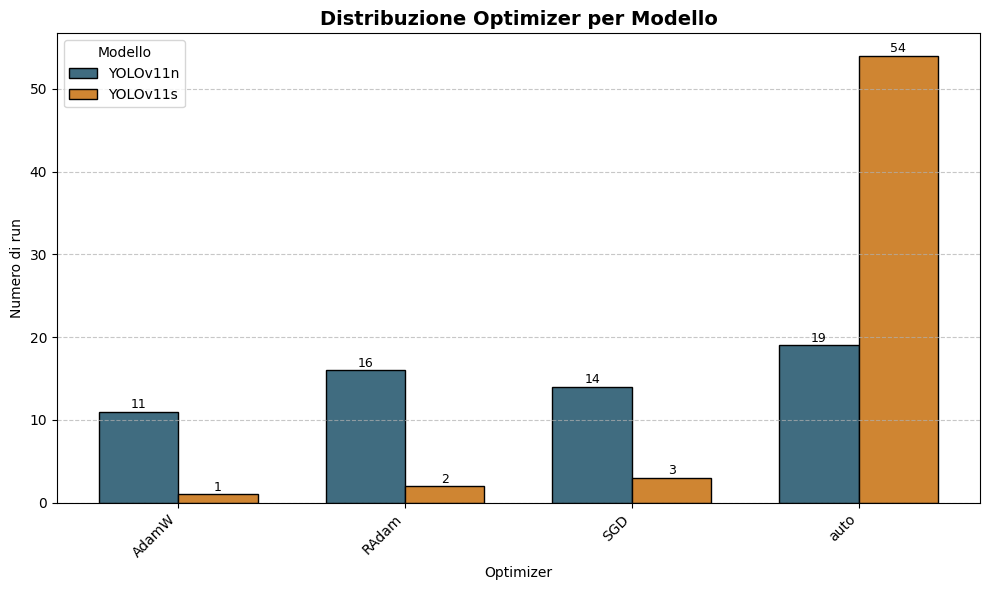

In [8]:
def plot_optimizer_distribution_grouped(df):
    """
    Mostra la distribuzione degli optimizer come diagramma a barre multiple,
    con barre blu e arancio per i modelli e numeri sopra ogni barra.
    
    Args:
        df (pd.DataFrame): deve contenere ['run_code', 'model', 'optimizer']
    """
    # Prendi l'ultimo optimizer per ogni run
    run_opts = df.groupby(["run_code", "model"], as_index=False)["optimizer"].last()

    # Tabella pivot: optimizer x model
    counts = run_opts.groupby(["optimizer", "model"]).size().unstack(fill_value=0)

    optimizers = counts.index
    models = counts.columns
    x = range(len(optimizers))
    width = 0.35  # larghezza barre

    fig, ax = plt.subplots(figsize=(10, 6))

    # Disegna barre affiancate (blu e arancio per i modelli)
    colors = [COLORS["blue"], COLORS["orange"]]
    for i, model in enumerate(models):
        bars = ax.bar(
            [pos + i * width for pos in x],
            counts[model],
            width=width,
            label=model,
            color=colors[i % 2],
            edgecolor="black"
        )
        # Etichette sopra ogni barra
        for bar in bars:
            height = bar.get_height()
            ax.text(
                bar.get_x() + bar.get_width()/2,
                height + 0.05,
                f"{int(height)}",
                ha="center", va="bottom", fontsize=9
            )

    # Etichette asse X centrate
    ax.set_xticks([pos + width / 2 for pos in x])
    ax.set_xticklabels(optimizers, rotation=45, ha="right")

    # Titolo e assi
    ax.set_title("Distribuzione Optimizer per Modello", fontsize=14, fontweight="bold")
    ax.set_xlabel("Optimizer")
    ax.set_ylabel("Numero di run")
    ax.grid(axis="y", linestyle="--", alpha=0.7)

    # Legenda
    ax.legend(title="Modello")

    plt.tight_layout()
    plt.show()

# --- Uso ---
plot_optimizer_distribution_grouped(df)

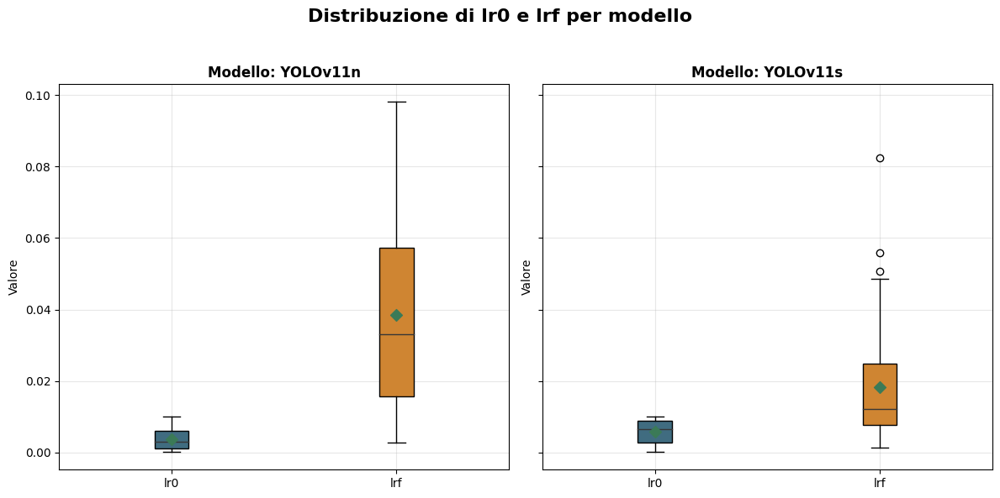

In [9]:
def plot_lr0_lrf_distribution_per_model(df):
    """
    Boxplot della distribuzione di lr0 e lrf per ogni modello.
    Raggruppa per run per evitare duplicati (valori ripetuti per epoche).

    Args:
        df (pd.DataFrame): DataFrame con colonne ['run_code', 'model', 'lr0', 'lrf']
    """
    # Collassa per run: prendi un valore per run (qui uso last, ma va bene anche first)
    run_lrs = df.groupby(["run_code", "model"], as_index=False)[["lr0", "lrf"]].last()

    models = run_lrs["model"].unique()
    n_models = len(models)

    fig, axes = plt.subplots(1, n_models, figsize=(6 * n_models, 6), sharey=True)

    if n_models == 1:
        axes = [axes]  # se c'è solo un modello, mantieni lista per iterare

    for ax, model in zip(axes, models):
        model_data = run_lrs[run_lrs["model"] == model]

        data = [model_data["lr0"].dropna().values,
                model_data["lrf"].dropna().values]

        labels = ["lr0", "lrf"]
        colors = [COLORS["blue"], COLORS["orange"]]

        # Boxplot
        bp = ax.boxplot(data, labels=labels, patch_artist=True,
                        medianprops=dict(color=COLORS["gray"], linewidth=1))

        # Colora i box
        for patch, color in zip(bp["boxes"], colors):
            patch.set_facecolor(color)

        # Media (punto rosso)
        means = [d.mean() for d in data]
        ax.scatter(range(1, len(means)+1), means, color=COLORS["green"], marker="D", s=50, zorder=3)

        # Titolo e griglia
        ax.set_title(f"Modello: {model}", fontsize=12, fontweight="bold")
        ax.set_ylabel("Valore")
        ax.grid(True, alpha=0.3)

    plt.suptitle("Distribuzione di lr0 e lrf per modello", fontsize=16, fontweight="bold")
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


# --- Uso ---
plot_lr0_lrf_distribution_per_model(df)

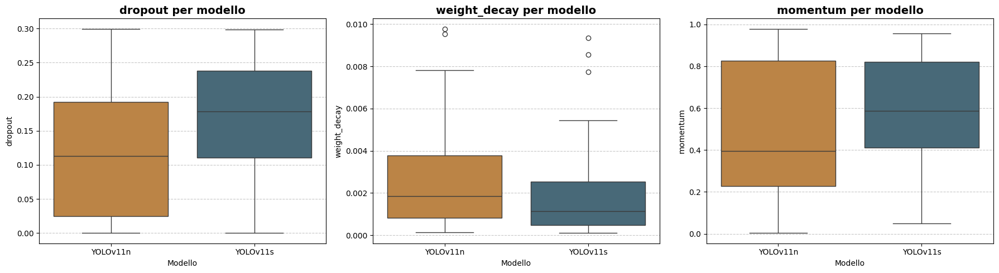

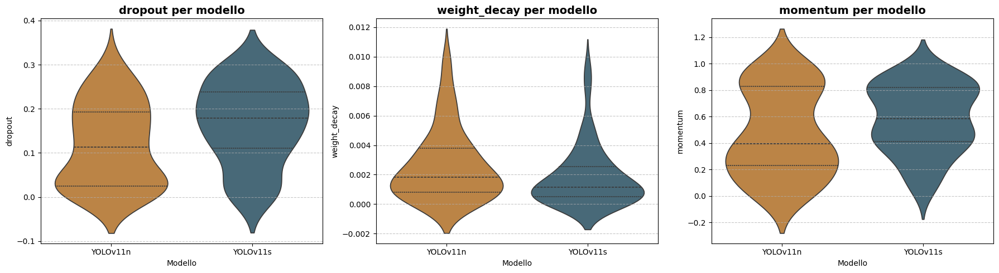

In [10]:
def plot_hyperparams_all(df, params=["dropout", "weight_decay", "momentum"], kind="box"):
    """
    Mostra la distribuzione di più iperparametri (dropout, weight_decay, momentum) per modello
    in un'unica figura con subplot.
    
    Args:
        df (pd.DataFrame): deve contenere ['run_code', 'model'] + params
        params (list of str): nomi delle colonne degli iperparametri
        kind (str): "box" o "violin"
    """
    n_params = len(params)
    fig, axes = plt.subplots(1, n_params, figsize=(6*n_params, 5), sharey=False)
    
    # Assicuriamoci che axes sia sempre una lista anche se n_params=1
    if n_params == 1:
        axes = [axes]
    
    # Palette dinamica per modelli
    models = df["model"].unique()
    color_list = [COLORS["blue"], COLORS["orange"], COLORS["red"], COLORS["green"], COLORS["gray"]]
    palette = {model: color_list[i % len(color_list)] for i, model in enumerate(models)}
    
    for ax, param in zip(axes, params):
        run_param = df.groupby(["run_code", "model"], as_index=False)[param].last()
        
        if kind == "box":
            sns.boxplot(
                data=run_param,
                x="model",
                y=param,
                hue="model",
                palette=palette,
                legend=False,
                ax=ax
            )
        elif kind == "violin":
            sns.violinplot(
                data=run_param,
                x="model",
                y=param,
                hue="model",
                palette=palette,
                legend=False,
                ax=ax,
                inner="quartile"
            )
        else:
            raise ValueError("kind deve essere 'box' o 'violin'")
        
        ax.set_title(f"{param} per modello", fontsize=14, fontweight="bold")
        ax.set_xlabel("Modello")
        ax.set_ylabel(param)
        ax.grid(axis="y", linestyle="--", alpha=0.7)
    
    plt.tight_layout()
    plt.show()

# --- Uso ---
plot_hyperparams_all(df, kind="box")
plot_hyperparams_all(df, kind="violin")

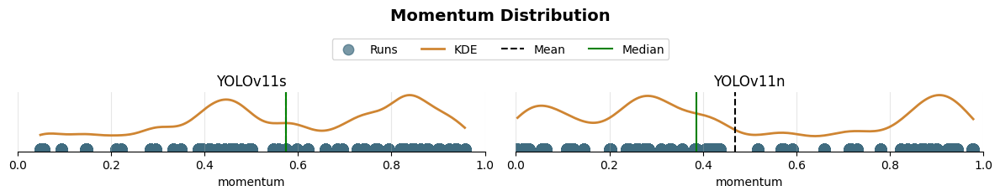

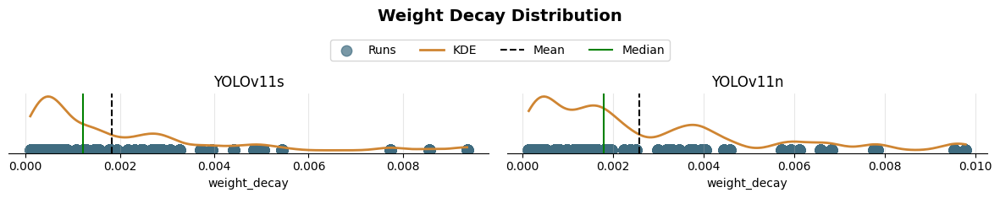

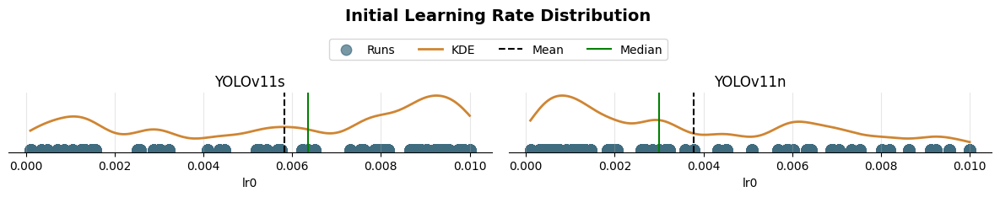

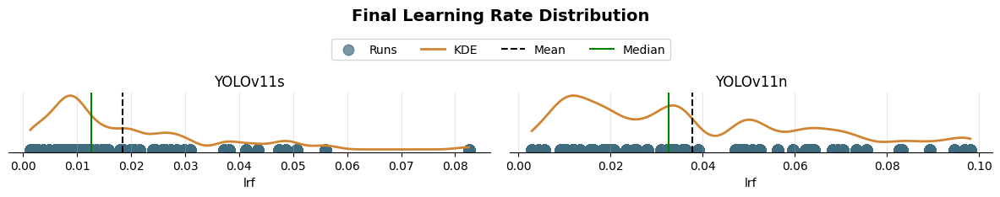

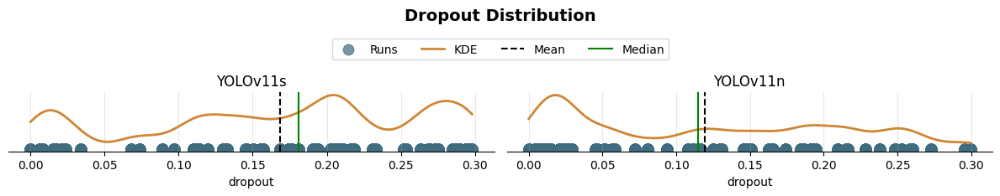

In [11]:
def plot_distribution_1d(df, model_col, value_col, title="Distribution", xlim=None):
    """
    Plot 1D dei valori di una variabile per ogni modello (o categoria) con KDE sovrapposta.
    Tutti i punti sono sull'asse x (y=0). Rimuove i bordi dei subplot tranne l'asse x.
    
    Args:
        df: DataFrame con almeno due colonne: una per i modelli/categorie e una per i valori
        model_col: nome della colonna dei modelli/categorie
        value_col: nome della colonna dei valori da plottare
        title: titolo generale del plot
        xlim: tupla (xmin, xmax) per limitare l'asse x, default None
    """
    models = df[model_col].unique()

    fig, axes = plt.subplots(1, len(models), figsize=(6*len(models), 2), sharey=True)
    if len(models) == 1:
        axes = [axes]

    for ax, model in zip(axes, models):
        values = df[df[model_col] == model][value_col].values

        # Tutti i punti hanno y=0
        ax.scatter(values, np.zeros_like(values), color=COLORS['blue'], s=80, alpha=0.7, label='Runs')

        # KDE per mostrare distribuzione
        if len(values) > 1:
            kde = gaussian_kde(values)
            x_grid = np.linspace(values.min(), values.max(), 200)
            density = kde(x_grid)
            density = density / density.max() * 0.2
            ax.plot(x_grid, density, color=COLORS['orange'], lw=2, label='KDE')

        # Media e mediana
        ax.axvline(values.mean(), color='black', linestyle='--', lw=1.5, label='Mean')
        ax.axvline(np.median(values), color='green', linestyle='-', lw=1.5, label='Median')

        ax.set_yticks([])
        ax.set_xlabel(value_col)
        ax.set_title(f'{model}')
        ax.grid(True, alpha=0.3)

        # Rimuovi spines verticali e superiore
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['left'].set_visible(False)
        ax.spines['bottom'].set_visible(True)

        # Limiti asse x
        if xlim is not None:
            ax.set_xlim(xlim)

    # Legenda esterna comune
    handles, labels = ax.get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper center', ncol=4, bbox_to_anchor=(0.5, 1.0))
    
    plt.suptitle(title, fontsize=14, fontweight='bold', y=1.15)
    plt.tight_layout()
    plt.show()

# --- Esempio di uso ---
# df deve avere una colonna 'model' e una colonna con valori, es: 'momentum'
plot_distribution_1d(df, model_col='model', value_col='momentum', title="Momentum Distribution", xlim=(0, 1))
plot_distribution_1d(df, model_col='model', value_col='weight_decay', title="Weight Decay Distribution")
plot_distribution_1d(df, model_col='model', value_col='lr0', title="Initial Learning Rate Distribution")
plot_distribution_1d(df, model_col='model', value_col='lrf', title="Final Learning Rate Distribution")
plot_distribution_1d(df, model_col='model', value_col='dropout', title="Dropout Distribution")

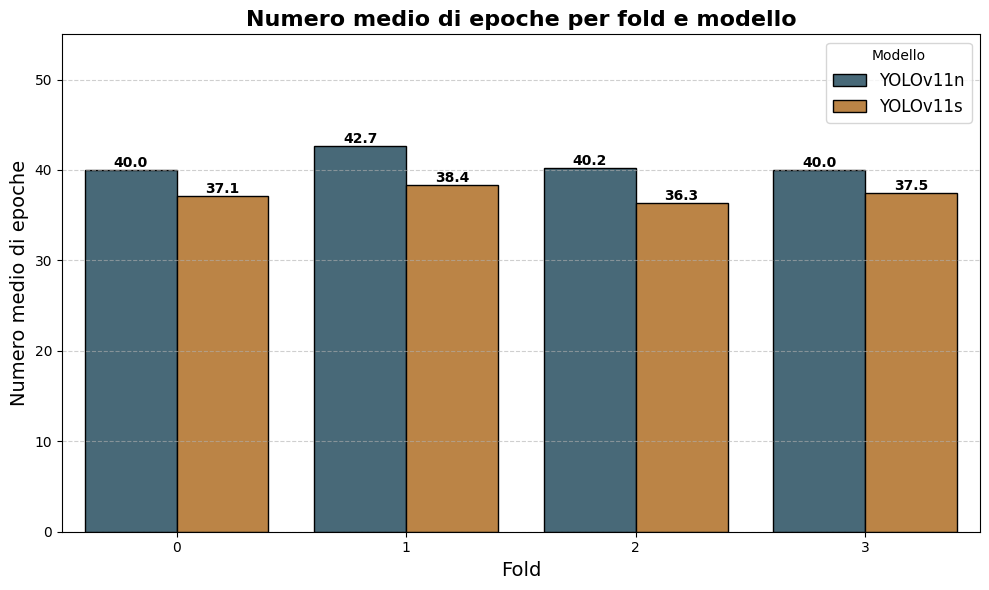

In [17]:
def plot_mean_epochs_per_fold(df):
    """
    Crea un barplot con il numero medio di epoche per ogni fold e modello.
    Si aspetta che df abbia le colonne: ['model', 'fold_number', 'epoch'].

    Args:
        df (pd.DataFrame): dataframe di input
    """
    # Calcolo numero medio di epoche per fold e modello
    mean_epochs = (
        df.groupby(['model', 'fold_number'])['epoch']
        .mean()
        .reset_index()
    )

    plt.figure(figsize=(10,6))
    sns.barplot(
        data=mean_epochs,
        x='fold_number',
        y='epoch',
        hue='model',
        palette=[COLORS['blue'], COLORS['orange']],
        edgecolor='black'
    )

    # Abbellimenti
    plt.title("Numero medio di epoche per fold e modello", fontsize=16, fontweight="bold")
    plt.xlabel("Fold", fontsize=14)
    plt.ylabel("Numero medio di epoche", fontsize=14)
    plt.grid(axis='y', linestyle='--', alpha=0.6)
    plt.legend(title="Modello", fontsize=12)

    # Etichette numeriche sopra le barre
    for p in plt.gca().patches:

        if p.get_height() > 0.0:
            
            plt.gca().annotate(
                f"{p.get_height():.1f}",
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='bottom',
                fontsize=10, fontweight='bold'
            )
    
    plt.ylim(0, 55)
    plt.tight_layout()
    plt.show()

plot_mean_epochs_per_fold(df)

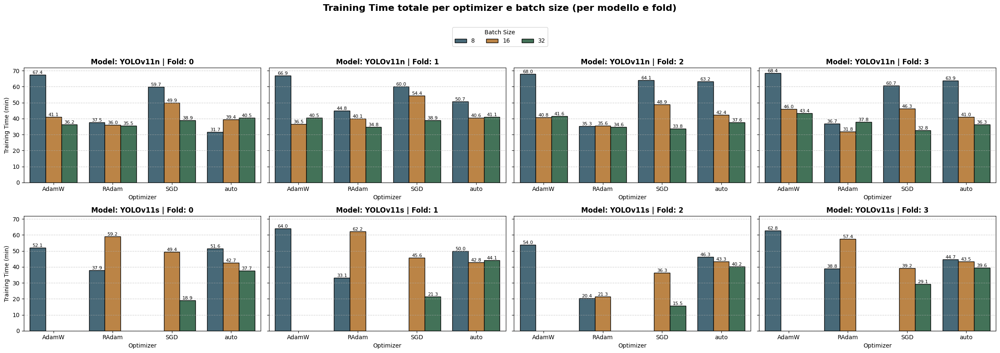

In [30]:
def plot_training_time_by_optimizer_and_batch(df):
    """
    Crea una griglia di subplot (modelli x folds).
    In ogni subplot, sull'asse X ci sono gli optimizer, sull'asse Y il training_time totale (in minuti).
    Ogni optimizer ha 3 barre che rappresentano i diversi batch_size.
    """
    # --- Step 1: estrai il tempo finale di ogni run (ultima epoca) ---
    run_last = df.sort_values("epoch").groupby(["model", "run_name", "fold_number"]).tail(1)
    run_last = run_last.assign(training_time_min=run_last["time"] / 60.0)

    # --- Step 2: aggrega ---
    grouped = (
        run_last.groupby(['model', 'fold_number', 'optimizer', 'batch_size'])['training_time_min']
        .mean()
        .reset_index()
    )

    models = sorted(grouped['model'].unique())
    folds = sorted(grouped['fold_number'].unique())

    n_rows = len(models)
    n_cols = len(folds)

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(6*n_cols, 4*n_rows), sharey=True)

    # Gestione assi
    if n_rows == 1 and n_cols == 1:
        axes = np.array([[axes]])
    elif n_rows == 1:
        axes = np.array([axes])
    elif n_cols == 1:
        axes = np.array([[ax] for ax in axes])

    palette = [COLORS['blue'], COLORS['orange'], COLORS['green']]

    for i, model in enumerate(models):
        for j, fold in enumerate(folds):
            ax = axes[i, j]
            data_sub = grouped[(grouped['model'] == model) & (grouped['fold_number'] == fold)]

            if data_sub.empty:
                ax.set_visible(False)
                continue

            sns.barplot(
                data=data_sub,
                x='optimizer',
                y='training_time_min',
                hue='batch_size',
                palette=palette,
                ax=ax,
                edgecolor="black"
            )

            # Rimuovo legenda interna
            ax.get_legend().remove()

            ax.set_title(f"Model: {model} | Fold: {fold}", fontsize=12, fontweight="bold")
            ax.set_xlabel("Optimizer")
            if j == 0:
                ax.set_ylabel("Training Time (min)")
            else:
                ax.set_ylabel("")
            ax.grid(axis='y', linestyle='--', alpha=0.6)

            # Etichette numeriche sopra le barre
            for p in ax.patches:
                height = p.get_height()
                if height > 0:
                    ax.annotate(
                        f"{height:.1f}",
                        (p.get_x() + p.get_width()/2., height),
                        ha='center', va='bottom',
                        fontsize=8
                    )

    # Legenda unica
    handles, labels = axes[0,0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper center', ncol=len(palette), title="Batch Size", bbox_to_anchor=(0.5, 0.99))

    plt.suptitle("Training Time totale per optimizer e batch size (per modello e fold)",
                 fontsize=16, fontweight="bold", y=1.05)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

plot_training_time_by_optimizer_and_batch(df)

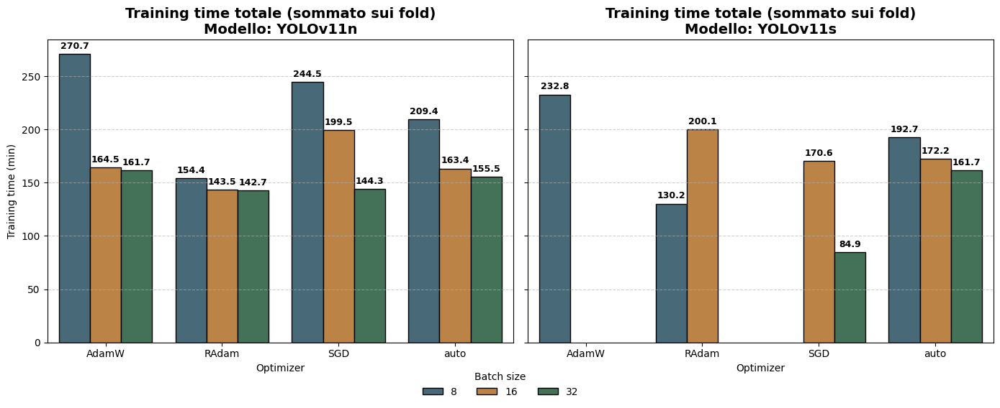

In [34]:
def plot_training_time_by_model_optimizer_batch(df):
    """
    Crea due subplot (uno per modello) con barre che mostrano 
    il tempo di training totale (in minuti) per optimizer e batch size,
    sommando i tempi medi su tutti i fold.
    """
    # --- Step 1: estrai il tempo finale di ogni run (ultima epoca) ---
    run_last = df.sort_values("epoch").groupby(["model", "run_name", "fold_number"]).tail(1)
    run_last = run_last.assign(training_time_min=run_last["time"] / 60.0)

    # --- Step 2: aggrega per fold ---
    agg_df = (
        run_last.groupby(['model', 'optimizer', 'batch_size', 'fold_number'])['training_time_min']
        .mean()
        .reset_index()
    )
    # --- Step 3: somma i tempi sui fold ---
    agg_df = (
        agg_df.groupby(['model', 'optimizer', 'batch_size'])['training_time_min']
        .sum()
        .reset_index()
    )

    # --- Definizione colori custom ---
    unique_batches = sorted(agg_df['batch_size'].unique())
    color_map = {
        b: c for b, c in zip(unique_batches, [COLORS['blue'], COLORS['orange'], COLORS['green']])
    }

    # --- Plot ---
    models = sorted(agg_df['model'].unique())
    fig, axes = plt.subplots(1, len(models), figsize=(7 * len(models), 6), sharey=True)
    if len(models) == 1:
        axes = [axes]

    for ax, model in zip(axes, models):
        sub = agg_df[agg_df['model'] == model]

        sns.barplot(
            data=sub,
            x='optimizer', y='training_time_min', hue='batch_size',
            palette=[color_map[b] for b in sub['batch_size'].unique()],
            ax=ax, edgecolor='black'
        )
        
        ax.set_title(f"Training time totale (sommato sui fold)\nModello: {model}", fontsize=14, fontweight="bold")
        ax.set_xlabel("Optimizer")
        ax.set_ylabel("Training time (min)" if ax == axes[0] else "")
        ax.grid(axis='y', linestyle='--', alpha=0.6)
        ax.legend_.remove()
        
        # --- Annotazioni sui valori ---
        for p in ax.patches:
            height = p.get_height()
            if np.isnan(height) or height <= 0:
                continue
            ax.annotate(
                f"{height:.1f}",
                (p.get_x() + p.get_width() / 2., height),
                ha='center', va='bottom',
                fontsize=9, fontweight='bold',
                xytext=(0, 3), textcoords='offset points'
            )
    
    # Legenda generale esterna
    handles, labels = ax.get_legend_handles_labels()
    fig.legend(handles, labels, title="Batch size", loc='lower center', ncol=len(labels), frameon=False, bbox_to_anchor=(0.5, -0.05))
    
    plt.tight_layout(rect=[0, 0, 1, 0.9])
    plt.show()

plot_training_time_by_model_optimizer_batch(df)

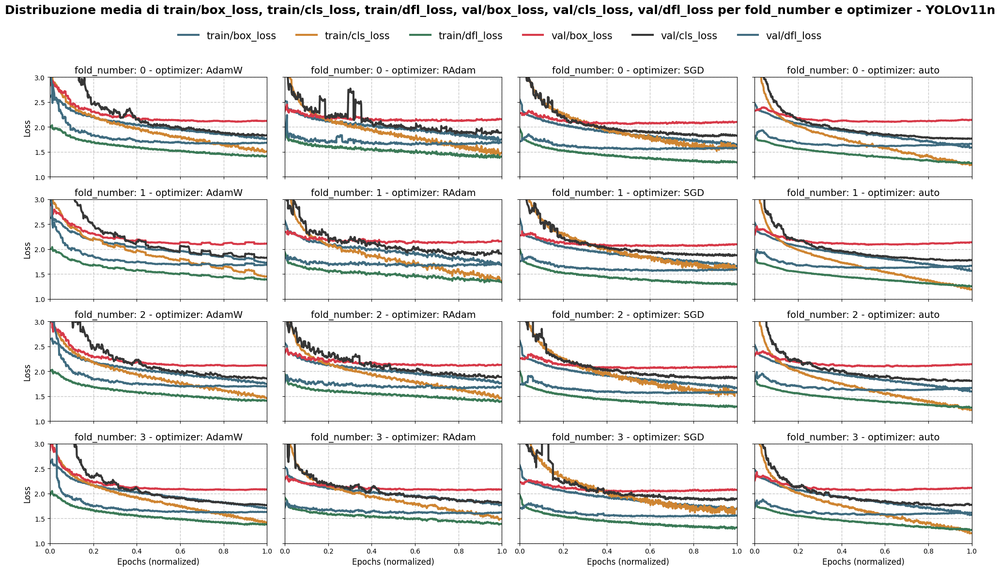

In [47]:
def plot_model_cols_dynamic_grid(
    df, 
    model_name, 
    cols, 
    row_var="fold_number", 
    col_var="optimizer", 
    smoothing_window=5, 
    y_label="Loss",
    y_limits=None  # Nuovo parametro: tuple (ymin, ymax)
):
    """
    Plotta le colonne (loss o metriche) per un modello specifico, applicando smoothing,
    con la griglia di subplot estendibile su due variabili a scelta.

    Args:
        df (pd.DataFrame): deve contenere ['run_code', 'model', row_var, col_var, 'normalized_epoch'] + cols
        model_name (str): nome del modello da filtrare
        cols (list[str]): lista delle colonne da visualizzare
        row_var (str): colonna da usare per le righe della griglia
        col_var (str): colonna da usare per le colonne della griglia
        smoothing_window (int): finestra per lo smoothing (rolling mean)
        y_label (str): etichetta per l'asse y
        y_limits (tuple, optional): limiti asse y (ymin, ymax). Default None.
    """
    # Filtra per modello
    df_model = df[df["model"] == model_name]

    rows = sorted(df_model[row_var].unique())
    cols_unique = sorted(df_model[col_var].unique())

    n_rows = len(rows)
    n_cols = len(cols_unique)

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(5*n_cols, 3*n_rows), sharex=True, sharey=True)

    # Gestione caso singolo subplot
    if n_rows == 1 and n_cols == 1:
        axes = np.array([[axes]])
    elif n_rows == 1:
        axes = np.array([axes])
    elif n_cols == 1:
        axes = np.array([[ax] for ax in axes])

    color_list = [COLORS["blue"], COLORS["orange"], COLORS["green"], COLORS["red"], COLORS["gray"]]

    for i, r in enumerate(rows):
        for j, c in enumerate(cols_unique):
            ax = axes[i, j]
            df_sub = df_model[(df_model[row_var] == r) & (df_model[col_var] == c)]

            if df_sub.empty:
                ax.set_visible(False)
                continue

            # Aggrega tutti i run per ogni normalized_epoch e colonna
            grouped = df_sub.groupby("normalized_epoch")[cols].mean()

            # Applica smoothing (rolling mean)
            grouped_smooth = grouped.rolling(window=smoothing_window, min_periods=1).mean()

            # Disegna le linee medie smoothed con spessore maggiore
            for k, col_name in enumerate(cols):
                color = color_list[k % len(color_list)]
                ax.plot(grouped_smooth.index, grouped_smooth[col_name], label=col_name, color=color, linewidth=3.0)

            ax.set_title(f"{row_var}: {r} - {col_var}: {c}", fontsize=14)
            if i == n_rows-1:
                ax.set_xlabel("Epochs (normalized)", fontsize=12)
            if j == 0:
                ax.set_ylabel(y_label, fontsize=12)
            
            # Griglia più evidente
            ax.grid(True, linestyle="--", linewidth=1.0, alpha=0.7)
            ax.set_xlim(0, 1)
            if y_limits is not None:
                ax.set_ylim(y_limits)

    # Legenda unica in alto
    handles, labels = ax.get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper center', ncol=len(cols), fontsize=15, frameon=False, bbox_to_anchor=(0.5, 0.95))

    plt.suptitle(f"Distribuzione media di {', '.join(cols)} per {row_var} e {col_var} - {model_name}",
                 fontsize=18, fontweight="bold")
    plt.tight_layout(rect=[0, 0, 1, 0.92])
    plt.show()

# --- Uso ---
plot_model_cols_dynamic_grid(df, model_name="YOLOv11n", 
                             cols=[
                                     'train/box_loss', 
                                     'train/cls_loss', 
                                     'train/dfl_loss',
                                     'val/box_loss', 
                                     'val/cls_loss', 
                                     'val/dfl_loss'
                                 ],
                             row_var='fold_number',
                             col_var='optimizer',
                             smoothing_window=20,
                             y_label='Loss',
                             y_limits=(1, 3)
)

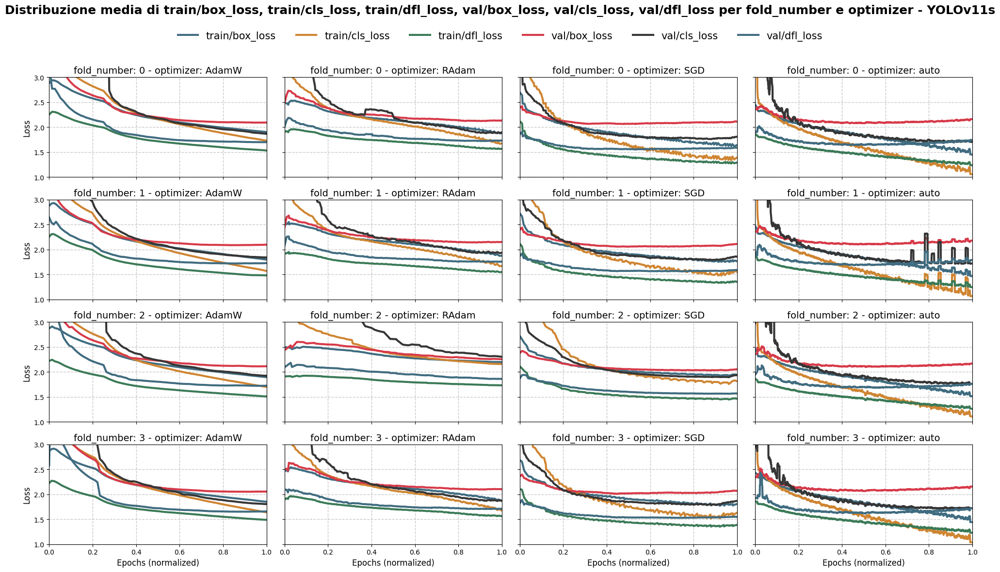

In [48]:
plot_model_cols_dynamic_grid(df, model_name="YOLOv11s", 
                             cols=[
                                     'train/box_loss', 
                                     'train/cls_loss', 
                                     'train/dfl_loss',
                                     'val/box_loss', 
                                     'val/cls_loss', 
                                     'val/dfl_loss'
                                 ],
                             row_var='fold_number',
                             col_var='optimizer',
                             smoothing_window=20,
                             y_label='Loss',
                             y_limits=(1, 3)
)

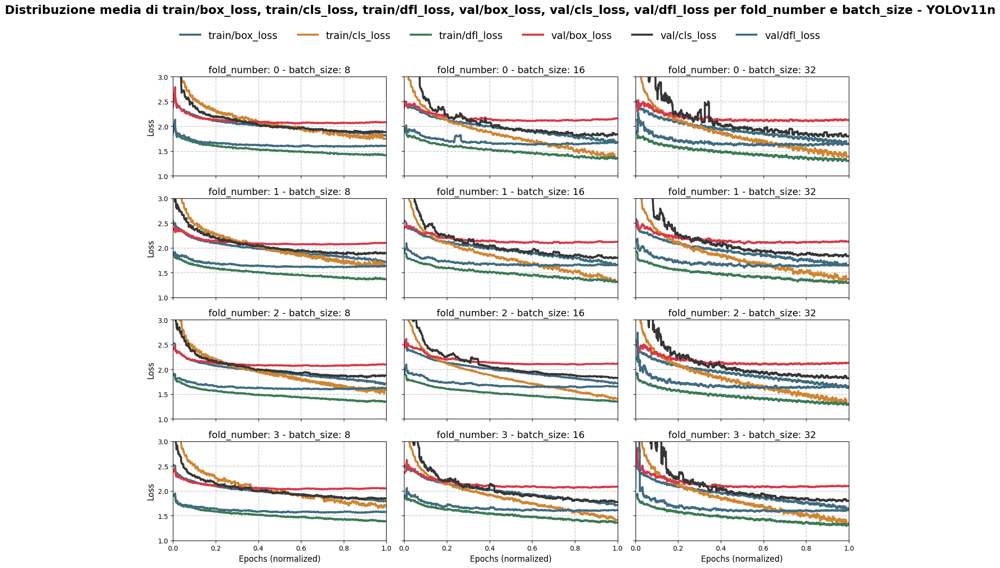

In [49]:
plot_model_cols_dynamic_grid(df, model_name="YOLOv11n", 
                             cols=[
                                     'train/box_loss', 
                                     'train/cls_loss', 
                                     'train/dfl_loss',
                                     'val/box_loss', 
                                     'val/cls_loss', 
                                     'val/dfl_loss'
                                 ],
                             row_var='fold_number',
                             col_var='batch_size',
                             smoothing_window=20,
                             y_label='Loss',
                             y_limits=(1, 3)
)

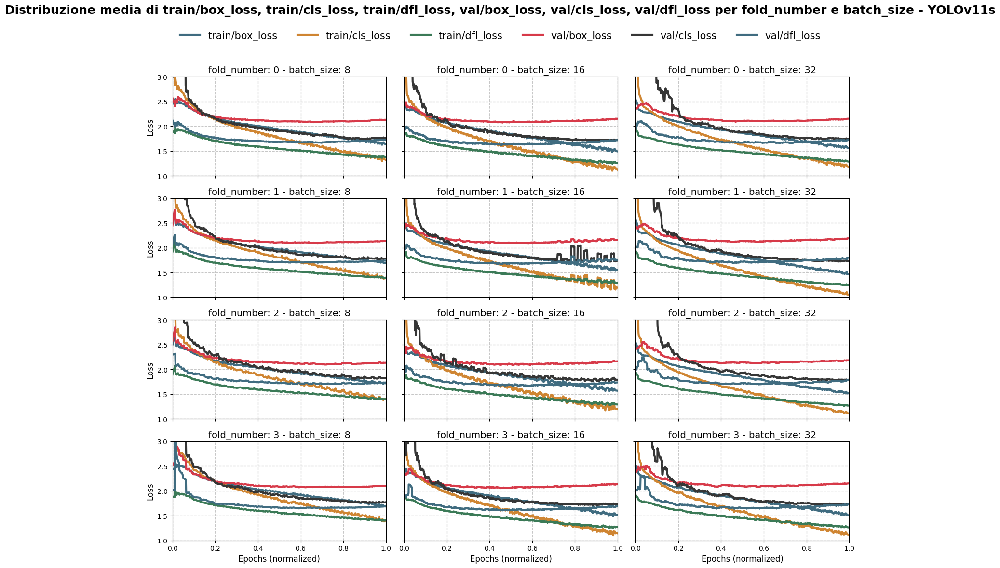

In [50]:
plot_model_cols_dynamic_grid(df, model_name="YOLOv11s", 
                             cols=[
                                     'train/box_loss', 
                                     'train/cls_loss', 
                                     'train/dfl_loss',
                                     'val/box_loss', 
                                     'val/cls_loss', 
                                     'val/dfl_loss'
                                 ],
                             row_var='fold_number',
                             col_var='batch_size',
                             smoothing_window=20,
                             y_label='Loss',
                             y_limits=(1, 3)
)

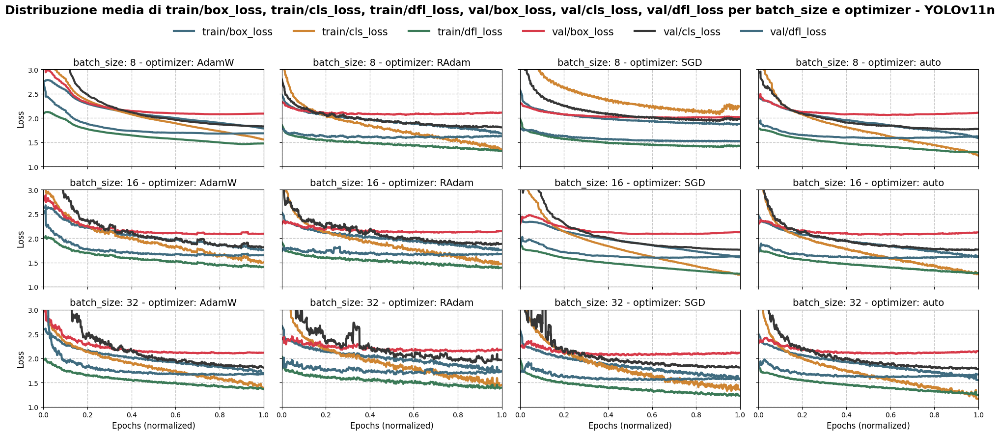

In [51]:
plot_model_cols_dynamic_grid(df, model_name="YOLOv11n", 
                             cols=[
                                     'train/box_loss', 
                                     'train/cls_loss', 
                                     'train/dfl_loss',
                                     'val/box_loss', 
                                     'val/cls_loss', 
                                     'val/dfl_loss'
                                 ],
                             row_var='batch_size',
                             col_var='optimizer',
                             smoothing_window=20,
                             y_label='Loss',
                             y_limits=(1, 3)
)

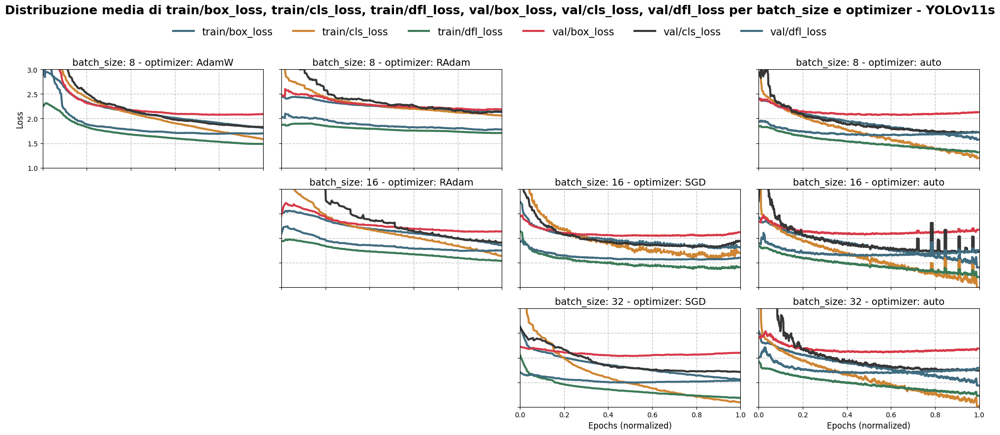

In [ ]:
plot_model_cols_dynamic_grid(df, model_name="YOLOv11s", 
                             cols=[
                                     'train/box_loss', 
                                     'train/cls_loss', 
                                     'train/dfl_loss',
                                     'val/box_loss', 
                                     'val/cls_loss', 
                                     'val/dfl_loss'
                                 ],
                             row_var='optimizer',
                             col_var='batch_size',
                             smoothing_window=20,
                             y_label='Loss',
                             y_limits=(1, 3)
)

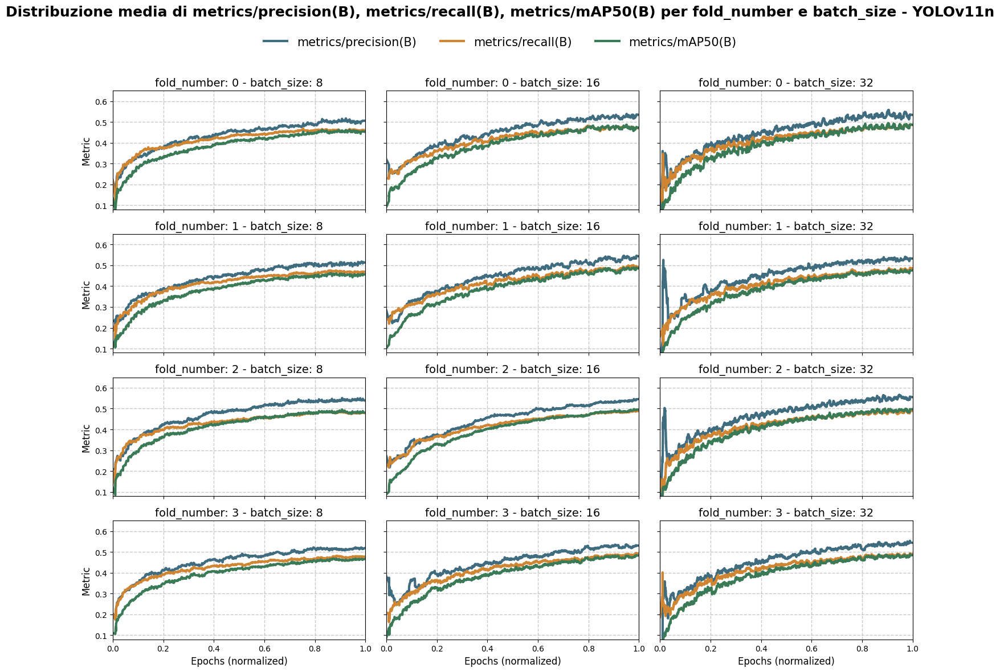

In [56]:
plot_model_cols_dynamic_grid(df, model_name="YOLOv11n", 
                             cols=[
                                 'metrics/precision(B)', 
                                 'metrics/recall(B)', 
                                 'metrics/mAP50(B)'
                                 ],
                             row_var='fold_number',
                             col_var='batch_size',
                             smoothing_window=20,
                             y_label='Metric',
                             y_limits=(0.08, 0.65)
)

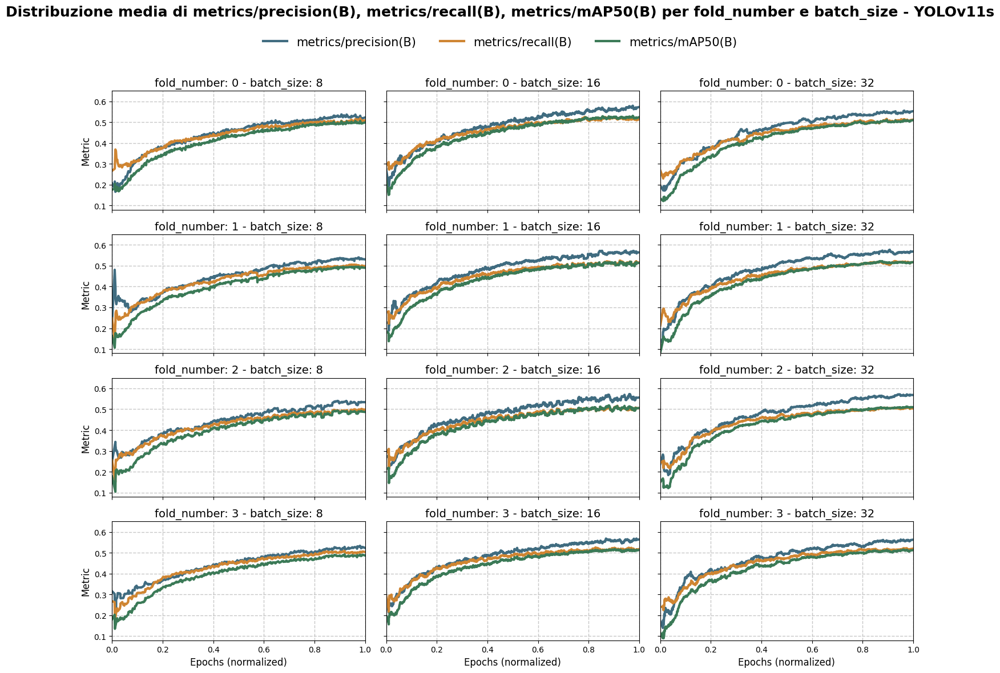

In [57]:
plot_model_cols_dynamic_grid(df, model_name="YOLOv11s", 
                             cols=[
                                 'metrics/precision(B)', 
                                 'metrics/recall(B)', 
                                 'metrics/mAP50(B)'
                                 ],
                             row_var='fold_number',
                             col_var='batch_size',
                             smoothing_window=20,
                             y_label='Metric',
                             y_limits=(0.08, 0.65)
)

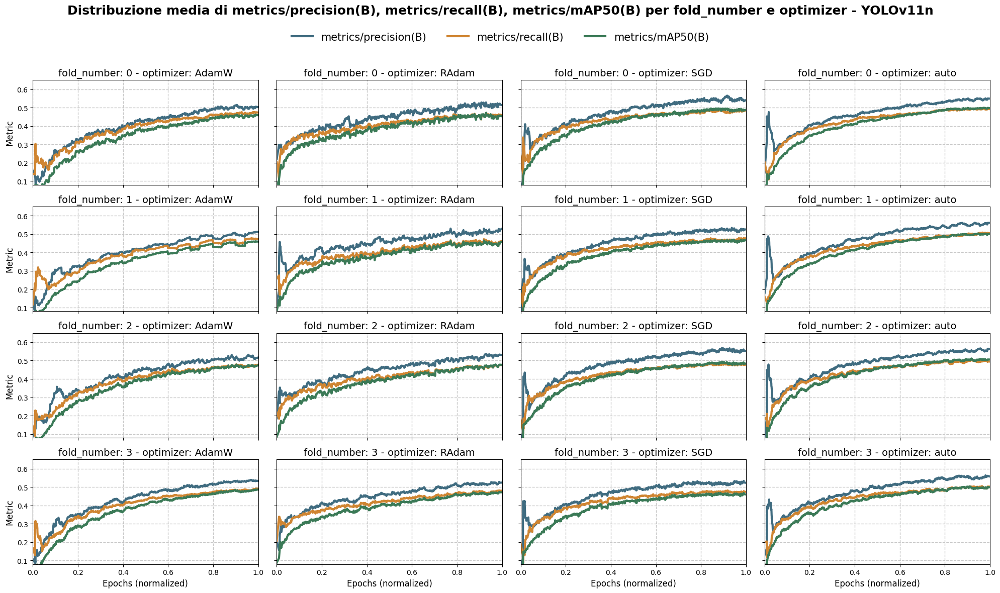

In [58]:
plot_model_cols_dynamic_grid(df, model_name="YOLOv11n", 
                             cols=[
                                 'metrics/precision(B)', 
                                 'metrics/recall(B)', 
                                 'metrics/mAP50(B)'
                                 ],
                             row_var='fold_number',
                             col_var='optimizer',
                             smoothing_window=20,
                             y_label='Metric',
                             y_limits=(0.08, 0.65)
)

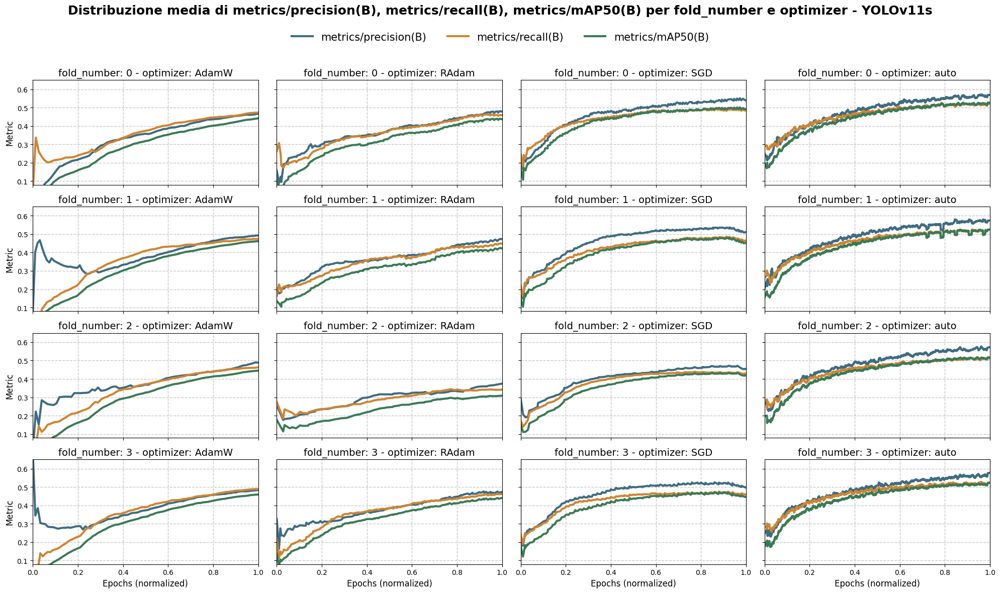

In [59]:
plot_model_cols_dynamic_grid(df, model_name="YOLOv11s", 
                             cols=[
                                 'metrics/precision(B)', 
                                 'metrics/recall(B)', 
                                 'metrics/mAP50(B)'
                                 ],
                             row_var='fold_number',
                             col_var='optimizer',
                             smoothing_window=20,
                             y_label='Metric',
                             y_limits=(0.08, 0.65)
)

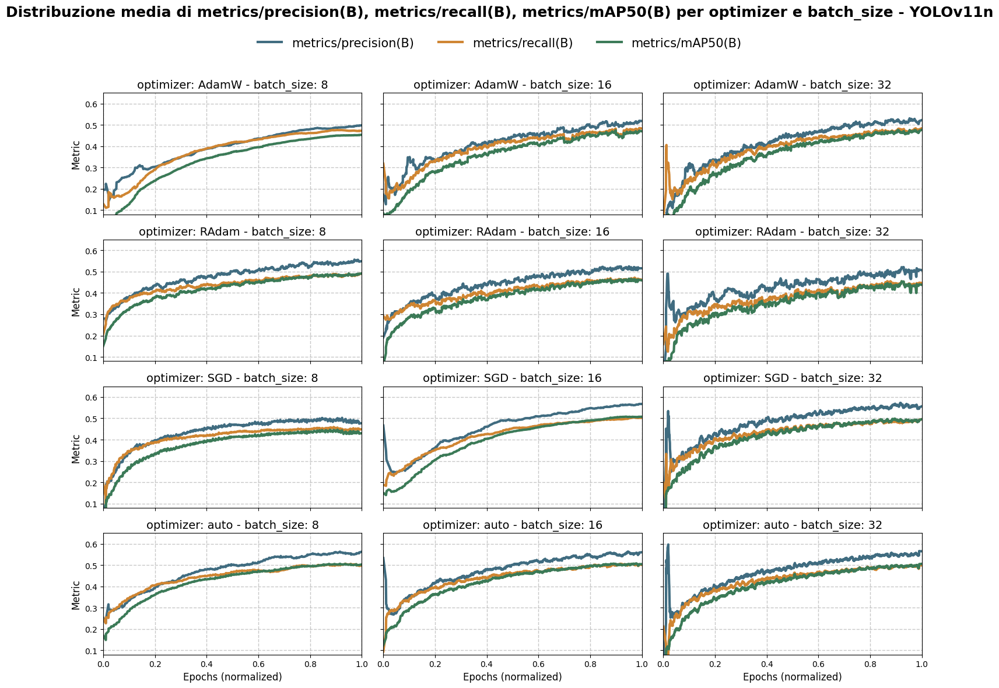

In [60]:
plot_model_cols_dynamic_grid(df, model_name="YOLOv11n", 
                             cols=[
                                 'metrics/precision(B)', 
                                 'metrics/recall(B)', 
                                 'metrics/mAP50(B)'
                                 ],
                             row_var='optimizer',
                             col_var='batch_size',
                             smoothing_window=20,
                             y_label='Metric',
                             y_limits=(0.08, 0.65)
)

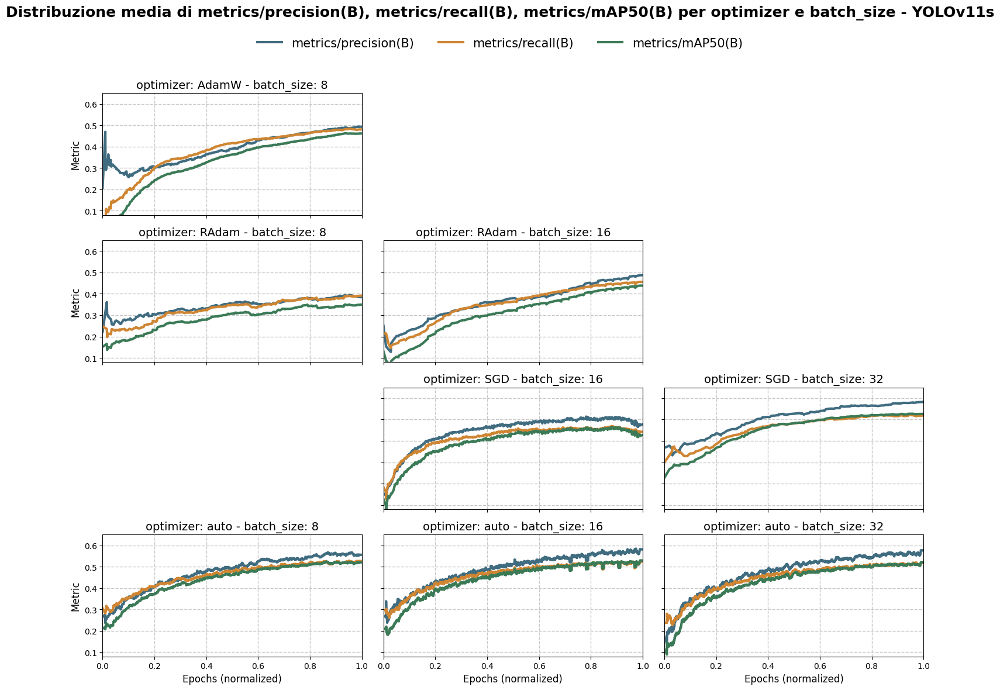

In [61]:
plot_model_cols_dynamic_grid(df, model_name="YOLOv11s", 
                             cols=[
                                 'metrics/precision(B)', 
                                 'metrics/recall(B)', 
                                 'metrics/mAP50(B)'
                                 ],
                             row_var='optimizer',
                             col_var='batch_size',
                             smoothing_window=20,
                             y_label='Metric',
                             y_limits=(0.08, 0.65)
)

In [36]:
df.columns

Index(['model', 'run_name', 'run_code', 'fold', 'fold_number', 'batch_size',
       'dropout', 'lr0', 'lrf', 'momentum', 'optimizer', 'weight_decay',
       'epoch', 'time', 'train/box_loss', 'train/cls_loss', 'train/dfl_loss',
       'metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)',
       'metrics/mAP50-95(B)', 'val/box_loss', 'val/cls_loss', 'val/dfl_loss',
       'lr/pg0', 'lr/pg1', 'lr/pg2', 'normalized_epoch', 'training_time',
       'metrics/f1(B)'],
      dtype='object')

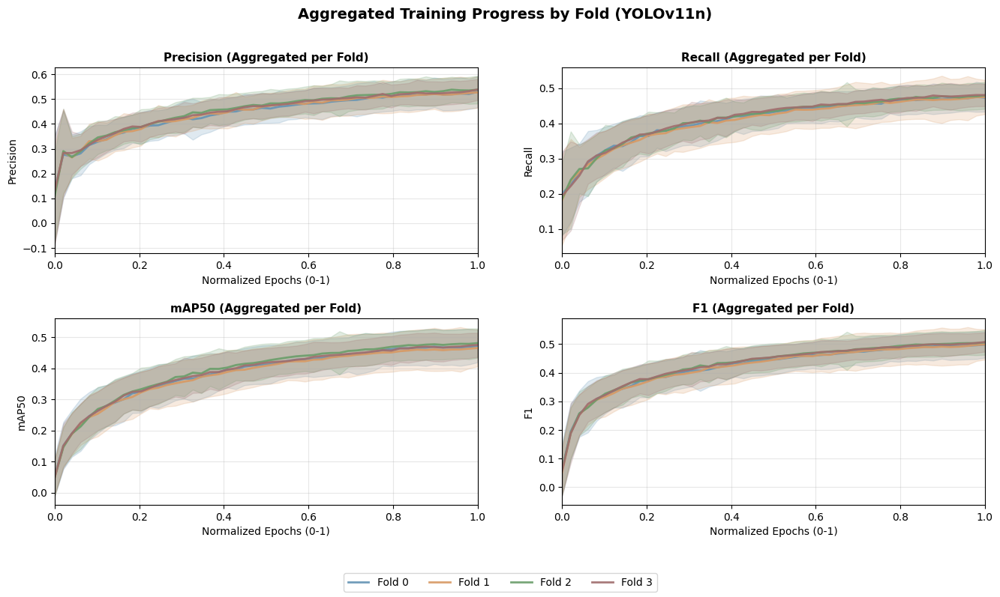

In [62]:
def plot_model_aggregates_by_fold(df, model_name=None, figsize=(16, 8), common_points=50):
    """
    Plot 2x2 delle metriche aggregando TUTTI i run di un modello,
    ma mantenendo i fold separati (ogni fold ha la sua curva media ± std).
    """
    if model_name:
        df = df[df["model"] == model_name]
        if df.empty:
            print(f"❌ Nessun dato trovato per il modello {model_name}")
            return

    metrics = {
        "Precision": "metrics/precision(B)",
        "Recall": "metrics/recall(B)",
        "mAP50": "metrics/mAP50(B)",
        "F1": "metrics/f1(B)"
    }

    fig, axes = plt.subplots(2, 2, figsize=figsize)
    axes = axes.flatten()
    fold_colors = ["#6393b4", "#d89963", "#6a9e6a", "#A06D6D", "#b47ba1", "#c2b06d"]  # più fold → più colori
    common_epochs = np.linspace(0, 1, common_points)

    handles, labels = [], []

    for idx, (metric_name, metric_col) in enumerate(metrics.items()):
        if metric_col not in df.columns:
            continue
        ax = axes[idx]

        for fold, fold_data_all in df.groupby("fold_number"):
            fold_curves = []

            # prendo tutti i run dentro questo fold
            for run_code, fold_data in fold_data_all.groupby("run_code"):
                fold_data = fold_data.sort_values("epoch")
                values = fold_data[metric_col].astype(float).dropna().values
                if values.size == 0:
                    continue

                epochs = fold_data["epoch"].values
                norm_epochs = (epochs - epochs.min()) / (epochs.ptp() if epochs.ptp() else 1)

                interp_values = np.interp(common_epochs, norm_epochs, values)
                fold_curves.append(interp_values)

            if fold_curves:
                fold_curves = np.vstack(fold_curves)
                mean, std = np.nanmean(fold_curves, 0), np.nanstd(fold_curves, 0)

                # curva media del fold
                line, = ax.plot(common_epochs, mean,
                                color=fold_colors[fold % len(fold_colors)],
                                lw=2, alpha=0.9)
                ax.fill_between(common_epochs, mean-std, mean+std,
                                color=fold_colors[fold % len(fold_colors)],
                                alpha=0.2)

                if idx == 0:  # legenda solo nel primo grafico
                    handles.append(line)
                    labels.append(f"Fold {fold}")

        ax.set_title(f"{metric_name} (Aggregated per Fold)", fontsize=11, fontweight="bold")
        ax.set_xlabel("Normalized Epochs (0-1)")
        ax.set_ylabel(metric_name)
        ax.set_xlim(0, 1)
        ax.grid(alpha=0.3)

    # nascondi subplot vuoti
    for i in range(len(metrics), 4):
        axes[i].set_visible(False)

    # legenda globale
    fig.legend(handles, labels, loc="lower center", ncol=len(labels), fontsize=10)
    plt.subplots_adjust(hspace=0.35, bottom=0.15)
    plt.suptitle(f"Aggregated Training Progress by Fold ({model_name})",
                 fontsize=14, fontweight="bold")
    plt.show()

plot_model_aggregates_by_fold(df, "YOLOv11n")

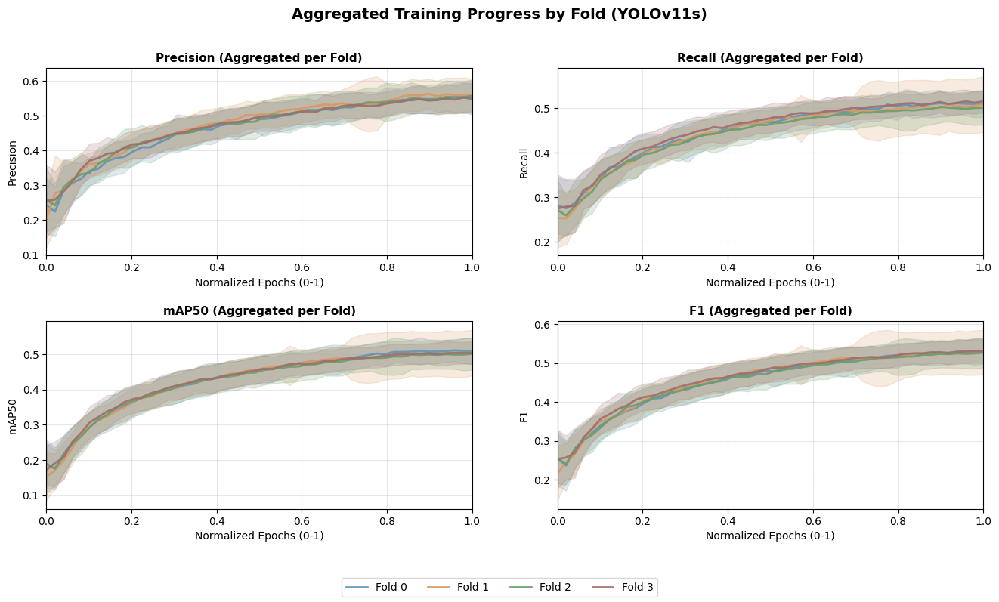

In [63]:
plot_model_aggregates_by_fold(df, "YOLOv11s")

🏆 Best Precision: YOLOv11n (run i9ix6mkd) score=0.5912
🏆 Best Recall: YOLOv11n (run i9ix6mkd) score=0.5168
🏆 Best mAP50: YOLOv11n (run i9ix6mkd) score=0.5199
🏆 Best F1: YOLOv11n (run i9ix6mkd) score=0.5513


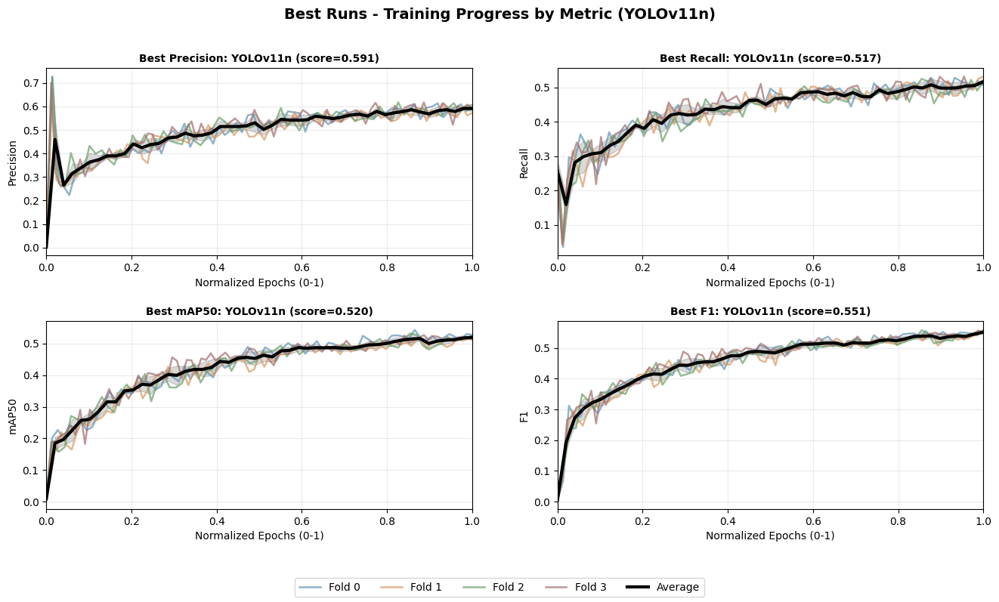

🏆 Best Precision: YOLOv11s (run 21dzzzyu) score=0.6035
🏆 Best Recall: YOLOv11s (run 2lp7qswl) score=0.5352
🏆 Best mAP50: YOLOv11s (run ep271vsp) score=0.5351
🏆 Best F1: YOLOv11s (run mww82odu) score=0.5539


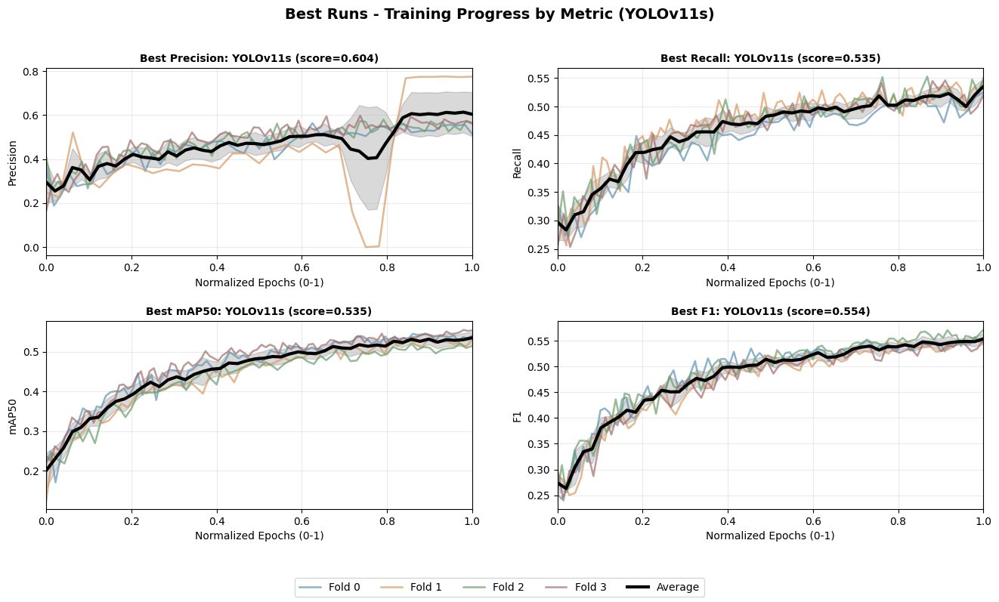

In [71]:
def find_best_run(df, metric, model_name=None, mode="last"):
    """
    Trova il run con la migliore performance media finale per la metrica specificata.

    Args:
        df (pd.DataFrame): dati con colonne 'run_code', 'fold_number', 'model' e metriche.
        metric (str): nome della colonna da valutare.
        model_name (str, opzionale): se specificato, filtra i dati per quel modello.
        mode (str): criterio per fold -> "last" (ultimo valore) o "max" (migliore valore).

    Returns:
        dict con run_code, model e score medio, oppure None se non trovato.
    """
    if metric not in df.columns:
        raise ValueError(f"La metrica '{metric}' non esiste nel DataFrame.")

    # Filtro per modello
    if model_name is not None:
        df = df[df["model"] == model_name]
        if df.empty:
            return None

    # Funzione per estrarre il valore dal fold
    def get_value(fold):
        vals = fold[metric].dropna()
        if vals.empty:
            return np.nan
        
        if mode == "last":
            return vals.iloc[-1]
        elif mode == "max":
            return vals.max()
        elif mode == "min":
            return vals.min()

    # Media sui fold → poi media per run
    group_cols = ["run_code", "model", "fold_number"]
    value_cols = [c for c in df.columns if c not in group_cols]

    scores = (
        df.groupby(group_cols, group_keys=False)[value_cols]
        .apply(get_value)
        .groupby(["run_code", "model"])
        .mean()
    )

    if scores.empty:
        return None

    # Seleziona il migliore
    best_idx = scores.idxmax()
    return {
        "run_code": best_idx[0],
        "model": best_idx[1],
        "score": scores.max()
    }

def plot_best_runs(df, model_name=None, figsize=(16, 8), common_points=50, mode='last'):
    """
    Plot 2x2 delle metriche per il best run di un modello, mostrando fold e curva media ± std.
    Aggiunge una legenda comune per tutti i subplot.

    Args:
        df: DataFrame con dati di training/validation
        model_name: filtra per modello specifico
        figsize: dimensione figura
        common_points: numero di punti per interpolazione
        mode: "last" o "max" per fold
    """
    if model_name:
        df = df[df["model"] == model_name]
        if df.empty:
            print(f"❌ Nessun dato trovato per il modello {model_name}")
            return

    metrics = {
        "Precision": "metrics/precision(B)",
        "Recall": "metrics/recall(B)",
        "mAP50": "metrics/mAP50(B)",
        "F1": "metrics/f1(B)"
    }

    best_runs = {name: (col, find_best_run(df, col, model_name, mode))
                 for name, col in metrics.items() if col in df.columns}
    best_runs = {k: v for k, v in best_runs.items() if v[1]}
    if not best_runs:
        print("❌ Nessun run trovato.")
        return

    for name, (_, br) in best_runs.items():
        print(f"🏆 Best {name}: {br['model']} (run {br['run_code'][:8]}) score={br['score']:.4f}")

    fig, axes = plt.subplots(2, 2, figsize=figsize)
    axes = axes.flatten()
    colors = ["#6393b4", "#d89963", "#6a9e6a", "#A06D6D"]
    common_epochs = np.linspace(0, 1, common_points)

    handles, labels = [], []

    for idx, (metric_name, (metric_col, best_run)) in enumerate(best_runs.items()):
        if idx >= 4: break

        ax = axes[idx]
        run_data = df[df["run_code"] == best_run["run_code"]]
        fold_curves = []

        for fold, fold_data in run_data.groupby("fold_number"):
            fold_data = fold_data.sort_values("epoch")
            values = fold_data[metric_col].astype(float).dropna().values
            if values.size == 0: continue

            epochs = fold_data["epoch"].values
            norm_epochs = (epochs - epochs.min()) / (epochs.ptp() if epochs.ptp() else 1)

            line, = ax.plot(norm_epochs, values, color=colors[fold % len(colors)], alpha=0.7, lw=1.8)
            fold_curves.append(np.interp(common_epochs, norm_epochs, values))
            if idx == 0:
                handles.append(line)
                labels.append(f"Fold {fold}")

        # Media ± std
        if fold_curves:
            fold_stack = np.vstack(fold_curves)
            mean, std = np.nanmean(fold_stack, 0), np.nanstd(fold_stack, 0)
            line_avg, = ax.plot(common_epochs, mean, color="black", lw=3)
            ax.fill_between(common_epochs, mean-std, mean+std, color="black", alpha=0.15)
            if idx == 0:
                handles.append(line_avg)
                labels.append("Average")

        ax.set_title(f"Best {metric_name}: {best_run['model']} (score={best_run['score']:.3f})",
                     fontsize=10, fontweight="bold")
        ax.set_xlabel("Normalized Epochs (0-1)")
        ax.set_ylabel(metric_name)
        ax.set_xlim(0, 1)
        ax.grid(alpha=0.25)

    # Nasconde subplot vuoti
    for i in range(len(best_runs), 4):
        axes[i].set_visible(False)

    # Legenda unica sotto i subplot
    fig.legend(handles, labels, loc='lower center', ncol=len(labels), fontsize=10)
    plt.subplots_adjust(hspace=0.35, bottom=0.15)
    plt.suptitle(f"Best Runs - Training Progress by Metric" + (f" ({model_name})" if model_name else ""),
                 fontsize=14, fontweight="bold")
    plt.show()

plot_best_runs(df, "YOLOv11n")
plot_best_runs(df, "YOLOv11s")

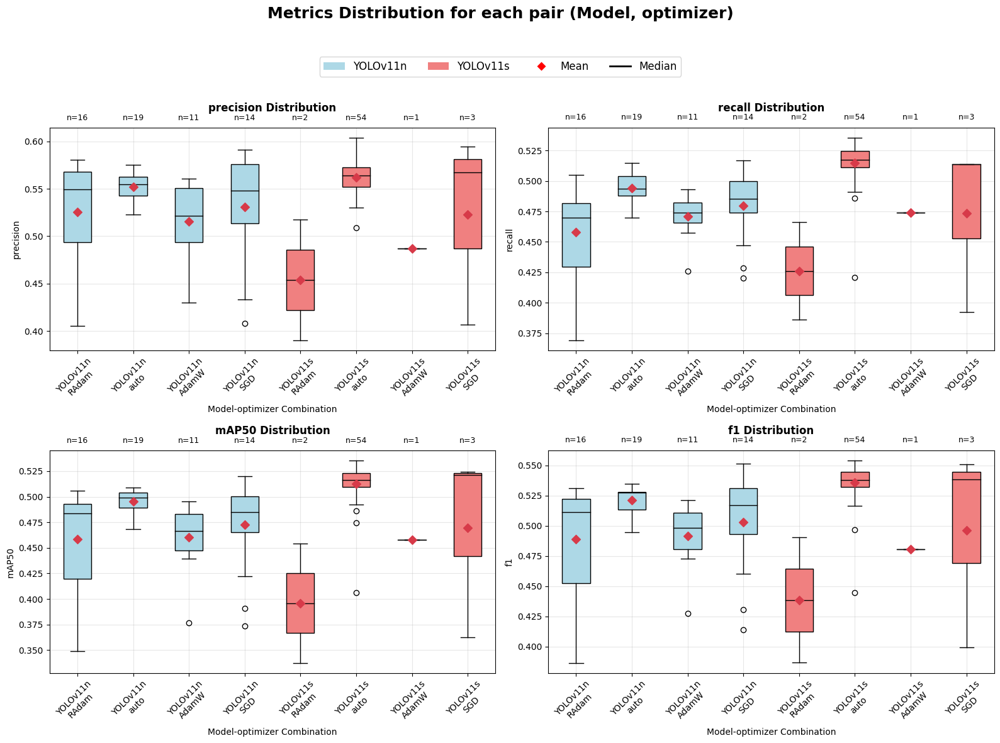

In [81]:
def prepare_final_metrics(df, split_col, metrics=None):
    """
    Estrae l'ultimo valore di ciascuna metrica per fold e run, 
    poi calcola la media per run (per boxplot o confronto tra configurazioni).

    Args:
        df (pd.DataFrame): DataFrame contenente i dati dei run.
        split_col (str): colonna categoriale da considerare (batch_size, optimizer, fold_number, ecc.)
        metrics (list[str], optional): Lista di colonne metriche da considerare. 
                                       Default: ['metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/f1(B)']

    Returns:
        pd.DataFrame: DataFrame aggregato con media delle metriche per run.
    """
    if metrics is None:
        metrics = ['metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/f1(B)']

    # Estrai ultimo valore per fold
    fold_df = (
        df.groupby(['run_code', 'model', split_col, 'fold_number'], as_index=False)[metrics]
          .last()
    )

    # Media per run (aggregando sui fold)
    run_means = fold_df.groupby(['run_code', 'model', split_col], as_index=False).mean(numeric_only=True)
    return run_means


def plot_boxplots(final_metrics, split_col, metrics=None):
    """
    Boxplot per ogni combinazione modello-<split_col> mostrando il numero di run,
    con legenda globale esterna (modello, media, mediana).

    Args:
        final_metrics: DataFrame con colonne 'model', split_col e le metriche finali per run
        split_col: colonna categoriale da usare (es. 'batch_size', 'optimizer', 'fold_number')
        metrics: lista di colonne da plottare (default: precision, recall, mAP50, F1)
    """
    if metrics is None:
        metrics = ["metrics/precision(B)", "metrics/recall(B)", "metrics/mAP50(B)", "metrics/f1(B)"]

    models = final_metrics["model"].unique()
    split_values = final_metrics[split_col].unique()
    model_colors = {model: color for model, color in zip(models, ["lightblue", "lightcoral", "lightgreen", "orange"])}

    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    axes = axes.flatten()

    for i, metric in enumerate(metrics):
        ax = axes[i]
        plot_data, labels, n_runs = [], [], []

        for model in models:
            for val in split_values:
                data = final_metrics[(final_metrics["model"] == model) &
                                     (final_metrics[split_col] == val)][metric]
                if not data.empty:
                    plot_data.append(data.values)
                    labels.append(f"{model}\n{val}")
                    n_runs.append(len(data))

        # Boxplot
        bp = ax.boxplot(plot_data, labels=labels, patch_artist=True, medianprops=dict(color='black', linewidth=1))

        # Colori box in base al modello
        for patch, lbl in zip(bp["boxes"], labels):
            model_name = lbl.split("\n")[0]
            patch.set_facecolor(model_colors.get(model_name, "lightgray"))

        # Media e mediana
        means = [np.mean(d) for d in plot_data]
        ax.scatter(range(1, len(means)+1), means, color=COLORS['red'], marker="D", s=50, zorder=3)

        # Numero di run sopra ogni box
        ylim_top = ax.get_ylim()[1]
        for x, n in enumerate(n_runs, start=1):
            ax.text(x, ylim_top * 1.01, f"n={n}", ha="center", va="bottom", fontsize=9)

        # Titolo e asse
        ax.set_title(metric.split("/")[-1].replace("(B)", "") + " Distribution",
                     fontsize=12, fontweight="bold", y=1.05)
        ax.set_xlabel(f"Model-{split_col} Combination")
        ax.set_ylabel(metric.split("/")[-1].replace("(B)", ""))
        ax.tick_params(axis="x", rotation=45)
        ax.grid(True, alpha=0.3)

    # Nasconde eventuali subplot vuoti
    for j in range(len(metrics), len(axes)):
        axes[j].set_visible(False)

    # Legenda globale esterna
    legend_elements = [mpatches.Patch(facecolor=color, label=model) for model, color in model_colors.items()]
    legend_elements += [
        Line2D([0], [0], marker='D', color='w', label='Mean', markerfacecolor='red', markersize=8),
        Line2D([0], [0], marker='_', color='black', label='Median', markersize=12, lw=2)
    ]
    plt.suptitle(f"Metrics Distribution for each pair (Model, {split_col})", fontsize=18, fontweight="bold")

    fig.legend(handles=legend_elements,
               loc='upper center',
               ncol=4,
               fontsize=12,
               bbox_to_anchor=(0.5, 0.92))

    plt.tight_layout(rect=[0, 0, 1, 0.9])
    plt.show()


# --- Uso ---
split_col_name = 'optimizer'  # o 'batch_size', 'optimizer', ecc.
final_metrics = prepare_final_metrics(df, split_col=split_col_name)
plot_boxplots(final_metrics, split_col=split_col_name)

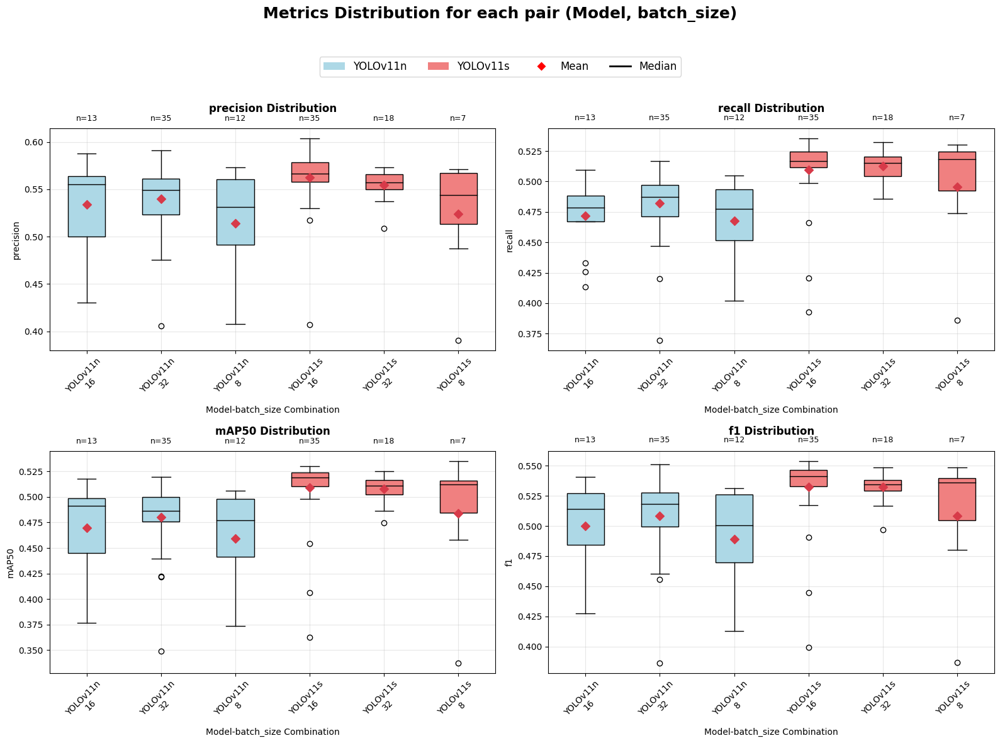

In [82]:
split_col_name = 'batch_size'  # o 'batch_size', 'optimizer', ecc.
final_metrics = prepare_final_metrics(df, split_col=split_col_name)
plot_boxplots(final_metrics, split_col=split_col_name)

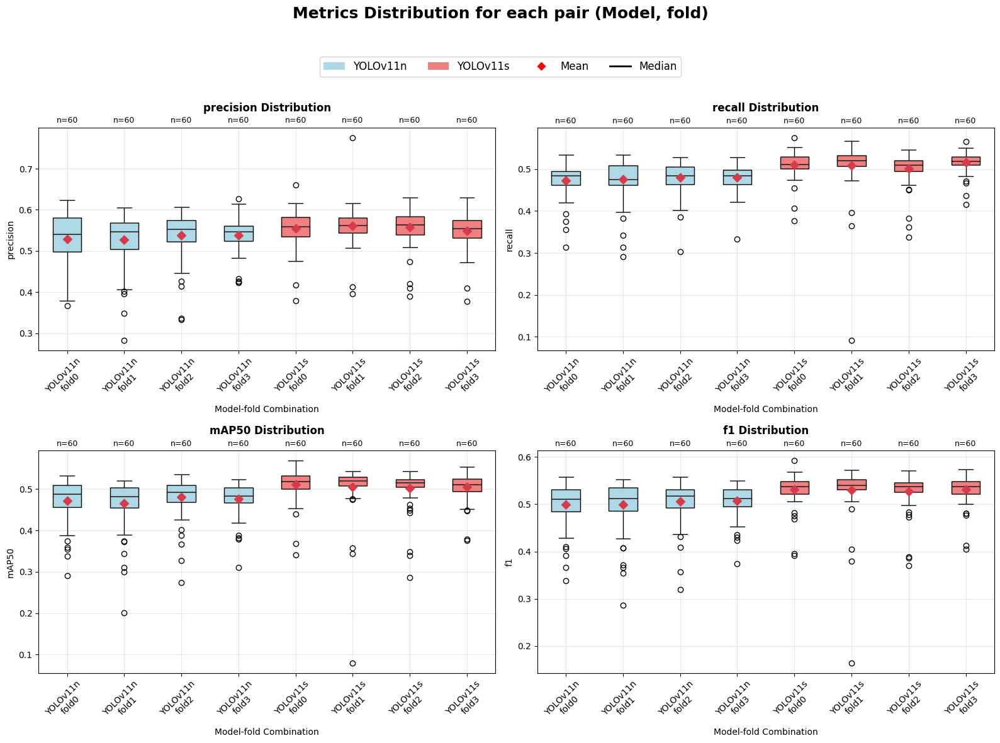

In [83]:
split_col_name = 'fold'
final_metrics = prepare_final_metrics(df, split_col=split_col_name)
plot_boxplots(final_metrics, split_col=split_col_name)

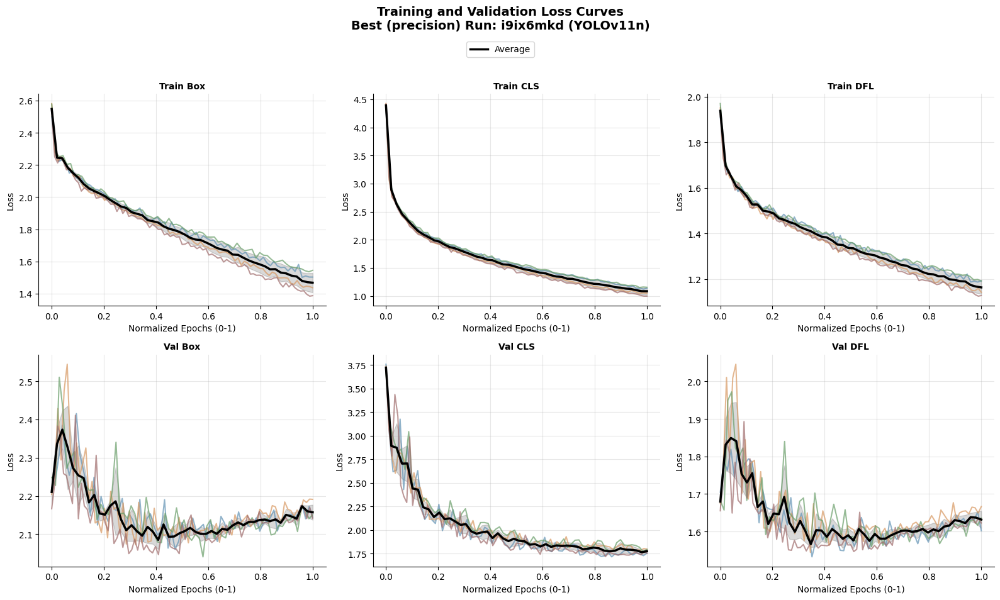

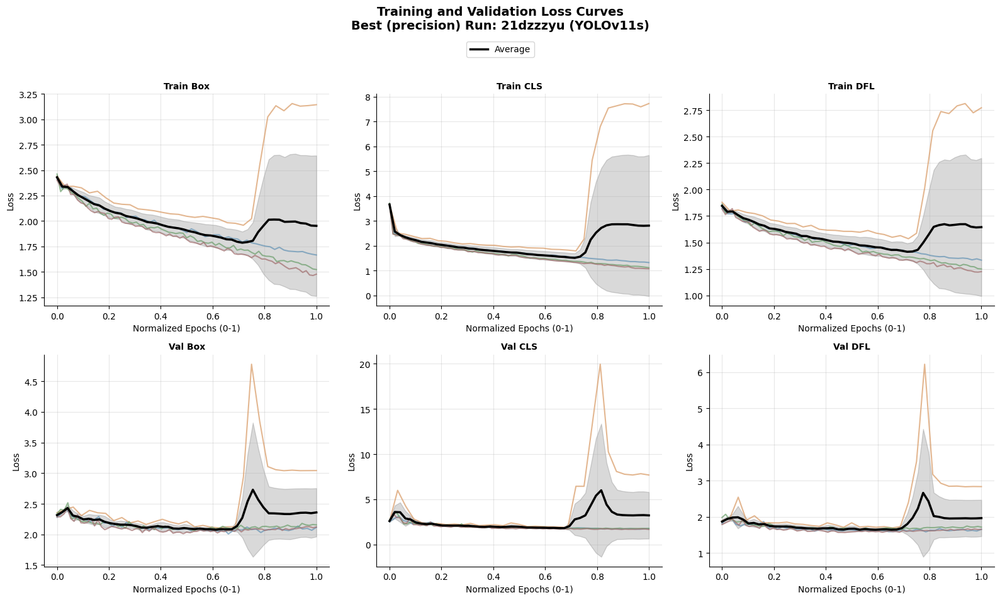

In [72]:
def plot_loss_curves(df, metric='metrics/precision(B)', model_name=None, figsize=(16,10), common_points=50, mode='last'):
    """
    Plot delle loss per il **run migliore** secondo una metrica specifica.
    Mostra 6 subplot (3 train + 3 val) con fold singoli e curva media.

    Args:
        df (pd.DataFrame): dati con colonne 'run_code', 'fold_number', 'model', 'epoch' e loss.
        metric (str): metrica da usare per selezionare il run migliore.
        model_name (str, opzionale): se specificato, filtra i dati per quel modello.
        figsize (tuple): dimensioni della figura.
        common_points (int): numero di punti per interpolazione delle curve medie.
    """
    # Trova il run migliore
    best_run = find_best_run(df, metric, model_name=model_name, mode=mode)
    if not best_run:
        print("❌ Nessun run trovato.")
        return

    df_run = df[df['run_code'] == best_run['run_code']]

    loss_cols = ['train/box_loss', 'train/cls_loss', 'train/dfl_loss',
                 'val/box_loss', 'val/cls_loss', 'val/dfl_loss']
    loss_names = ['Train Box', 'Train CLS', 'Train DFL', 'Val Box', 'Val CLS', 'Val DFL']
    colors = ["#6393b4", "#d89963", "#6a9e6a", "#A06D6D"]

    fig, axes = plt.subplots(2, 3, figsize=figsize)
    axes = axes.flatten()

    for idx, (col, name) in enumerate(zip(loss_cols, loss_names)):
        ax = axes[idx]
        all_fold_interp = []

        for fold_idx, fold in enumerate(sorted(df_run['fold_number'].unique())):
            fold_data = df_run[df_run['fold_number'] == fold].sort_values('epoch')
            if fold_data.empty or col not in fold_data.columns:
                continue

            values = fold_data[col].astype(float).values
            if np.all(np.isnan(values)):
                continue

            epochs = fold_data['epoch'].values
            norm_epochs = (epochs - epochs.min()) / (epochs.max() - epochs.min()) if len(epochs) > 1 else np.zeros_like(epochs)

            ax.plot(norm_epochs, values, color=colors[fold_idx % len(colors)], alpha=0.7, linewidth=1.5)

            # Interpolazione per media
            if len(norm_epochs) > 1 and np.sum(~np.isnan(values)) >= 2:
                interp_vals = np.interp(np.linspace(0,1,common_points), norm_epochs, values)
                all_fold_interp.append(interp_vals)

        if all_fold_interp:
            all_fold_interp = np.vstack(all_fold_interp)
            mean_curve = np.nanmean(all_fold_interp, axis=0)
            std_curve = np.nanstd(all_fold_interp, axis=0)
            x_common = np.linspace(0,1,common_points)
            ax.plot(x_common, mean_curve, color='black', linewidth=2.5, label='Average')
            ax.fill_between(x_common, mean_curve-std_curve, mean_curve+std_curve, color='black', alpha=0.15)

        ax.set_title(name, fontsize=10, fontweight='bold')
        ax.set_xlabel('Normalized Epochs (0-1)')
        ax.set_ylabel('Loss')
        ax.grid(True, alpha=0.3)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

    for i in range(len(loss_cols), len(axes)):
        axes[i].set_visible(False)

    # Legenda unica
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper center', ncol=len(labels), bbox_to_anchor=(0.5, 0.95))

    title = f"Training and Validation Loss Curves\nBest (precision) Run: {best_run['run_code']}"
    if model_name:
        title += f" ({model_name})"
    plt.suptitle(title, fontsize=14, fontweight='bold', y=1.0)
    plt.tight_layout(rect=[0, 0.05, 1, 0.95])
    plt.show()


plot_loss_curves(df, metric='metrics/precision(B)', model_name="YOLOv11n")
plot_loss_curves(df, metric='metrics/precision(B)', model_name="YOLOv11s")

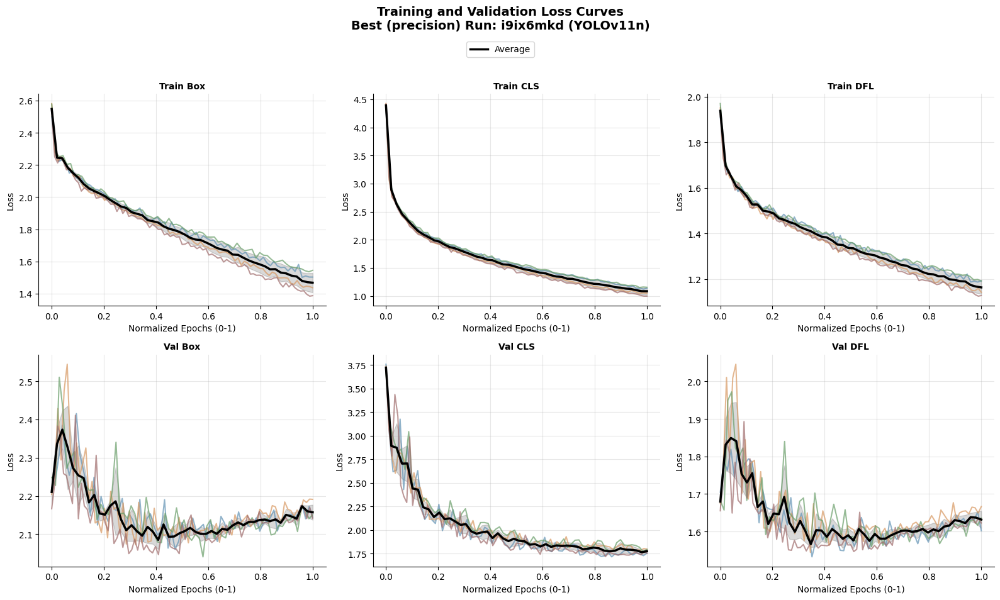

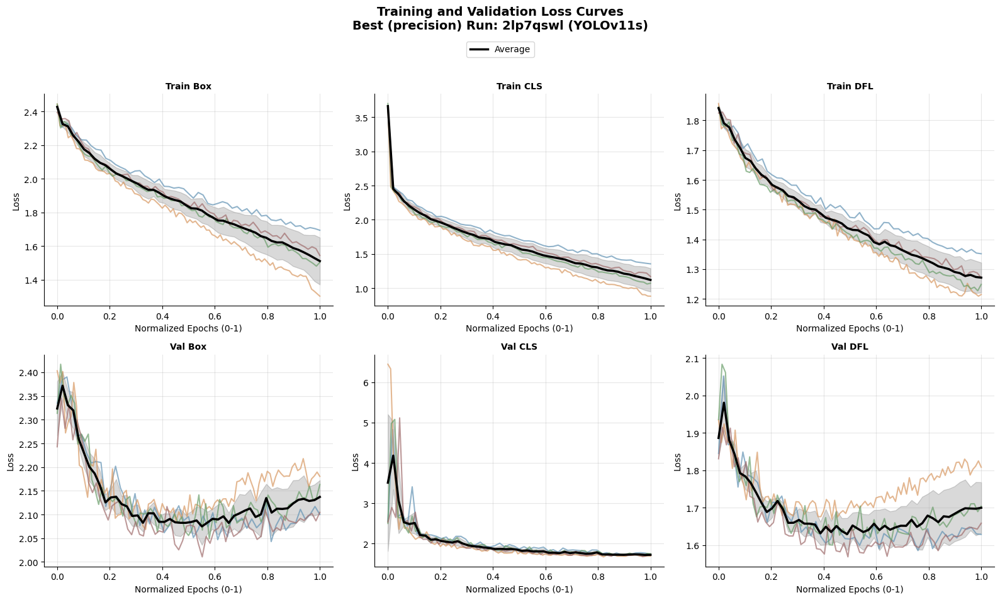

In [73]:
plot_loss_curves(df, metric='metrics/recall(B)', model_name="YOLOv11n")
plot_loss_curves(df, metric='metrics/recall(B)', model_name="YOLOv11s")

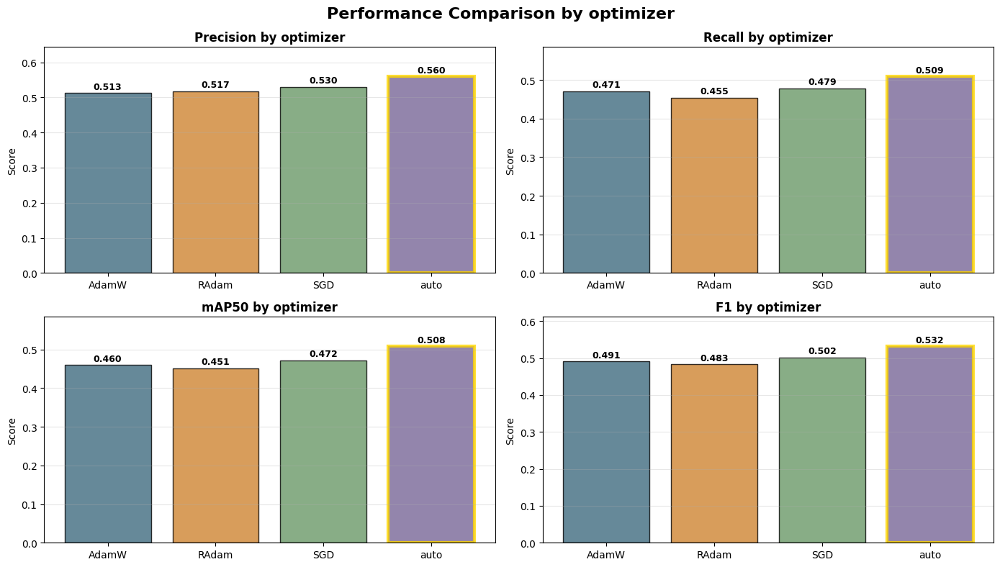

In [88]:
def final_score_parametric(df, metric, group_value, group_col="optimizer"):
    """
    Calcola la media delle ultime metriche per un valore specifico di una colonna categoriale.

    Args:
        df (pd.DataFrame)
        metric (str): colonna metrica
        group_value: valore della colonna categoriale da aggregare
        group_col (str): nome della colonna categoriale (es. optimizer, batch_size, fold_number)
    
    Returns:
        float: media delle ultime metriche per tutti i run e fold corrispondenti
    """
    df[group_col] = df[group_col].astype(str)
    group_value = str(group_value)

    runs = df[df[group_col] == group_value]['run_code'].unique()
    scores = []
    for run in runs:
        sub = df[(df['run_code'] == run) & (df[group_col] == group_value)]
        for fold, fd in sub.groupby("fold_number"):
            if not fd.empty:
                scores.append(fd[metric].iloc[-1])
    return np.mean(scores) if scores else None


def plot_comparison(df, group_col="optimizer", figsize=(14, 8)):
    """
    Grafico a barre comparativo parametrico per una colonna categoriale usando i colori definiti in COLORS.
    
    Args:
        df (pd.DataFrame)
        group_col (str): colonna categoriale da usare come confronto (es. optimizer, batch_size, fold_number)
        figsize (tuple): dimensione della figura
    """
    df[group_col] = df[group_col].astype(str)
    
    metrics = {
        'Precision': 'metrics/precision(B)',
        'Recall': 'metrics/recall(B)',
        'mAP50': 'metrics/mAP50(B)',
        'F1': 'metrics/f1(B)'
    }

    group_values = sorted(df[group_col].unique())
    
    # Usa i tuoi colori a ciclo
    base_colors = [COLORS['blue'], COLORS['orange'], COLORS['green'], COLORS['purple'], COLORS['gray']]
    colors = [base_colors[i % len(base_colors)] for i in range(len(group_values))]

    fig, axes = plt.subplots(2, 2, figsize=figsize)
    axes = axes.flatten()

    for i, (name, col) in enumerate(metrics.items()):
        ax = axes[i]
        scores = [final_score_parametric(df, col, val, group_col) for val in group_values]
        valid = [(val, s, c) for val, s, c in zip(group_values, scores, colors) if s is not None]

        if valid:
            vals_labels, vals, cols = zip(*valid)
            bars = ax.bar(vals_labels, vals, color=cols, alpha=0.8, edgecolor="black")

            # valori sopra le barre
            for b, v in zip(bars, vals):
                ax.text(b.get_x() + b.get_width() / 2, v * 1.01, f"{v:.3f}", 
                        ha="center", va="bottom", fontsize=9, fontweight="bold")

            # evidenzia best
            best = np.argmax(vals)
            bars[best].set_edgecolor("gold")
            bars[best].set_linewidth(3)

            ax.set_ylim(0, max(vals) * 1.15)
            ax.set_title(f"{name} by {group_col}", fontsize=12, fontweight="bold")
            ax.set_ylabel("Score")
            ax.grid(axis="y", alpha=0.3)

    plt.suptitle(f"Performance Comparison by {group_col}", fontsize=16, fontweight="bold")
    plt.tight_layout()
    plt.show()

plot_comparison(df, group_col='optimizer')

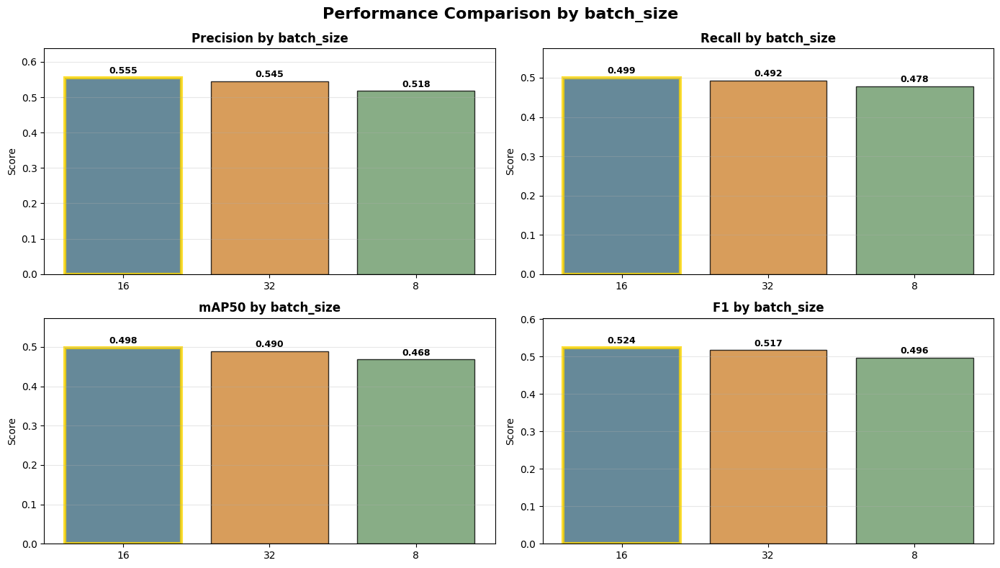

In [89]:
plot_comparison(df, group_col='batch_size')

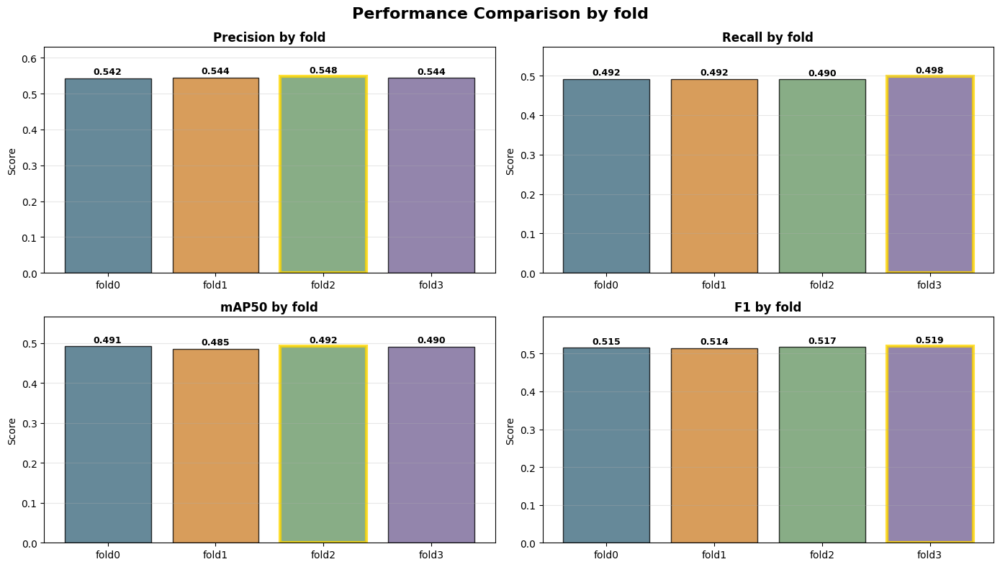

In [90]:
plot_comparison(df, group_col='fold')


📈 Generando curve di training per optimizer...


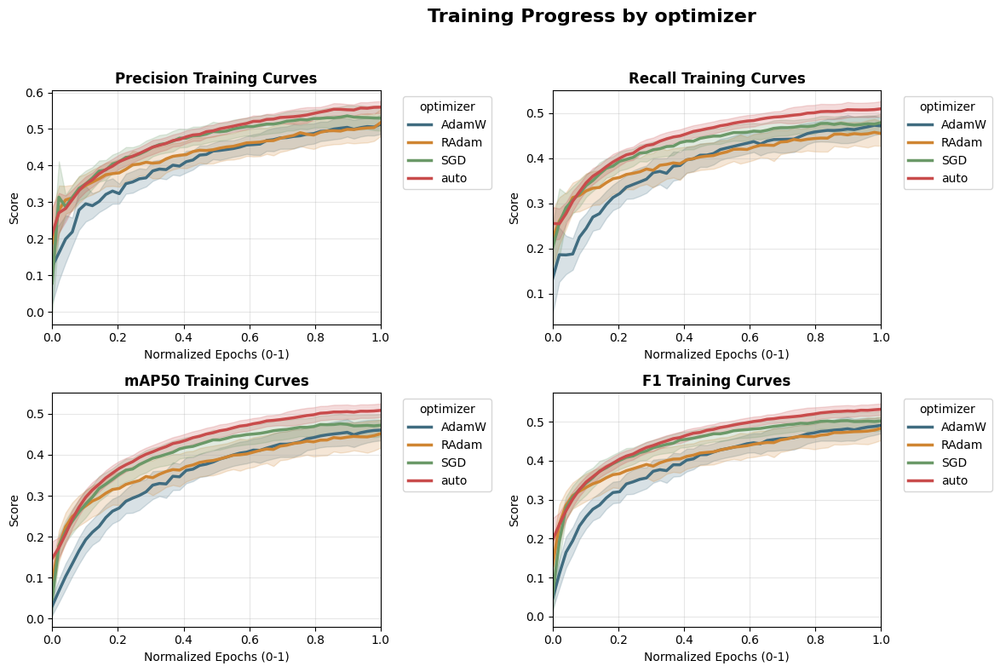

In [ ]:
def plot_categorical_curves(df, category_col="optimizer", figsize=(14, 8)):
    """
    Plotta le curve di training normalizzate per ogni valore di una colonna categoriale
    (es. optimizer, batch_size, fold), con media e banda di deviazione standard.

    Args:
        df (pd.DataFrame)
        category_col (str): colonna categoriale da usare come confronto (optimizer, batch_size, ecc.)
        figsize (tuple): dimensione della figura
    """
    df[category_col] = df[category_col].astype(str)
    
    metrics = {
        'Precision': 'metrics/precision(B)',
        'Recall': 'metrics/recall(B)',
        'mAP50': 'metrics/mAP50(B)',
        'F1': 'metrics/f1(B)'
    }

    cat_values = sorted(df[category_col].unique())
    # Usa i colori dal dizionario a ciclo
    base_colors = [COLORS['blue'], COLORS['orange'], COLORS['green'], COLORS['red'], COLORS['gray']]
    colors = [base_colors[i % len(base_colors)] for i in range(len(cat_values))]

    fig, axes = plt.subplots(2, 2, figsize=figsize)
    axes = axes.flatten()

    for i, (name, col) in enumerate(metrics.items()):
        ax = axes[i]
        for val, color in zip(cat_values, colors):
            curves = []
            subset = df[df[category_col] == val]
            for (run, fold), fd in subset.groupby(['run_code', 'fold_number']):
                if len(fd) > 1:
                    fd = fd.sort_values("epoch")
                    epochs = fd["epoch"].values
                    vals = fd[col].values
                    # normalizzazione tra 0 e 1
                    norm_e = (epochs - epochs.min()) / (epochs.max() - epochs.min())
                    # interpola a 50 punti uniformi
                    curves.append(np.interp(np.linspace(0,1,50), norm_e, vals))
            if curves:
                curves = np.vstack(curves)
                mean, std = curves.mean(0), curves.std(0)
                x = np.linspace(0,1,50)
                ax.plot(x, mean, color=color, lw=2.5, label=val)
                ax.fill_between(x, mean-std/2, mean+std/2, color=color, alpha=0.2)

        ax.set_title(f"{name} Training Curves", fontsize=12, fontweight="bold")
        ax.set_xlabel("Normalized Epochs (0-1)")
        ax.set_ylabel("Score")
        ax.set_xlim(0,1)
        ax.grid(alpha=0.3)
        ax.legend(title=category_col, bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.suptitle(f"Training Progress by {category_col}", fontsize=16, fontweight="bold")
    plt.tight_layout(rect=[0,0,0.85,0.95])
    plt.show()
    
plot_categorical_curves(df, category_col='optimizer')

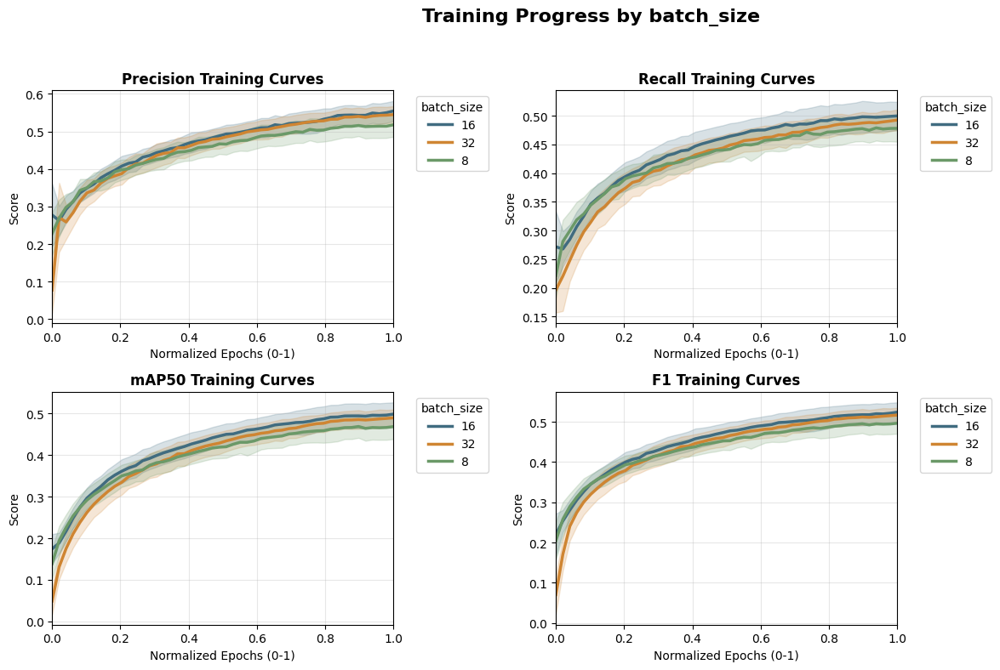

In [92]:
plot_categorical_curves(df, category_col='batch_size')

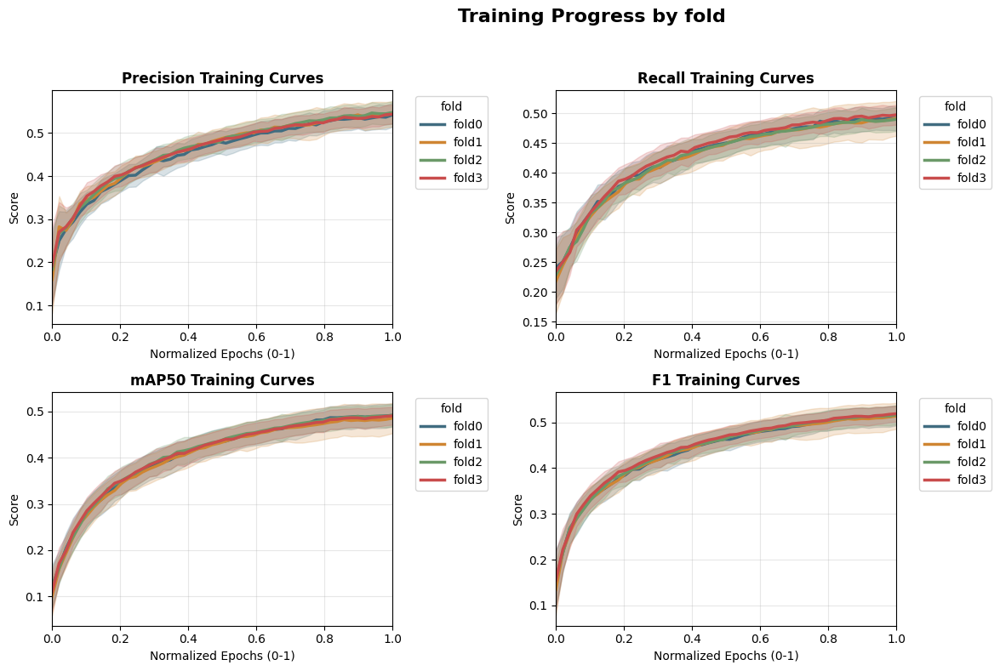

In [93]:
plot_categorical_curves(df, category_col='fold')

Fitting del modello Random Forest Regressor su 'YOLOv11n'... OK!
Calcolo Permutation Importance:


100%|██████████| 10/10 [00:20<00:00,  2.00s/it]


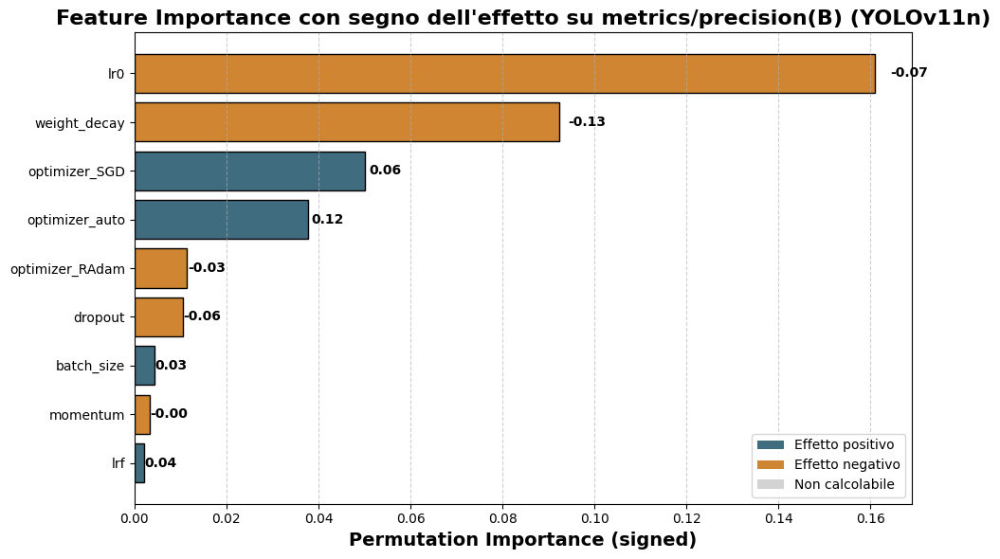

,feature,importance,std,effect_corr
3,lrf,0.002046,0.0,0.041445
4,momentum,0.003278,0.0,-0.003246
0,batch_size,0.004349,0.0,0.026953
1,dropout,0.010458,0.0,-0.062079
6,optimizer_RAdam,0.011385,0.0,-0.033326
8,optimizer_auto,0.037687,0.0,0.124263
7,optimizer_SGD,0.050076,0.0,0.055425
5,weight_decay,0.092394,0.0,-0.130921
2,lr0,0.160994,0.0,-0.071909


In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import permutation_importance
from tqdm import tqdm
from matplotlib.patches import Patch

def plot_permutation_fi_signed(df, model_name, target_col='metrics/precision(B)', n_repeats=20):
    """
    Plotta il Feature Importance con segno dell'effetto per un modello specifico,
    mostrando anche i valori di correlazione accanto alle barre.
    
    Args:
        df (pd.DataFrame): dataframe con colonne hyperparameter + target_col + 'model'
        model_name (str): nome del modello da filtrare
        target_col (str): la metrica su cui valutare l'importanza
        n_repeats (int): numero di ripetizioni per la Permutation Importance
    """
    # Filtra per modello
    df_model = df[df['model'] == model_name]
    if df_model.empty:
        raise ValueError(f"Nessun dato trovato per il modello '{model_name}'")

    features = ['batch_size', 'dropout', 'lr0', 'lrf', 'momentum', 'optimizer', 'weight_decay']
    X = df_model[features].copy()
    y = df_model[target_col].values

    # Codifica categoriche
    X = pd.get_dummies(X, columns=['optimizer'], drop_first=True)
    feature_names = X.columns

    # Fit modello
    model = RandomForestRegressor(n_estimators=200, random_state=42)
    print(f"Fitting del modello Random Forest Regressor su '{model_name}'...", end=' ')
    model.fit(X, y)
    print_color("OK!", "green")

    # Permutation Importance con progress bar
    print("Calcolo Permutation Importance:")
    importances_mean = np.zeros(X.shape[1])
    importances_std = np.zeros(X.shape[1])

    for i in tqdm(range(n_repeats)):
        r = permutation_importance(model, X, y, n_repeats=1, random_state=i, scoring='r2')
        importances_mean += r.importances_mean
        importances_std += r.importances_std

    importances_mean /= n_repeats
    importances_std /= n_repeats

    fi_df = pd.DataFrame({
        'feature': feature_names,
        'importance': importances_mean,
        'std': importances_std
    }).sort_values('importance', ascending=True)

    # Calcolo segno effetto con gestione robusta
    signed_colors = []
    corr_values = []
    for f in fi_df['feature']:
        try:
            x = pd.to_numeric(X[f], errors="coerce")
            if x.isnull().all():
                corr = np.nan
            else:
                corr = np.corrcoef(x.fillna(0), y)[0, 1]
        except Exception:
            corr = np.nan
        corr_values.append(corr)
        if np.isnan(corr):
            signed_colors.append("lightgray")  # neutro se non calcolabile
        else:
            signed_colors.append(COLORS['blue'] if corr >= 0 else COLORS['orange'])

    # Plot signed con valori accanto
    plt.figure(figsize=(10,6))
    bars = plt.barh(fi_df['feature'], fi_df['importance'],
                    color=signed_colors, edgecolor='black')

    plt.xlabel("Permutation Importance (signed)", fontsize=14, fontweight='bold')
    plt.title(f"Feature Importance con segno dell'effetto su {target_col} ({model_name})",
              fontsize=16, fontweight='bold')
    plt.grid(axis='x', linestyle='--', alpha=0.6)

    # Aggiungi valori di correlazione a destra di ogni barra
    for bar, corr in zip(bars, corr_values):
        width = bar.get_width()
        if not np.isnan(corr):
            plt.text(width + abs(width)*0.02, bar.get_y() + bar.get_height()/2, f"{corr:.2f}",
                     va='center', ha='left', fontsize=10, fontweight='bold')

    # Legenda manuale
    legend_elements = [
        Patch(facecolor=COLORS['blue'], label='Effetto positivo'),
        Patch(facecolor=COLORS['orange'], label='Effetto negativo')
    ]
    plt.legend(handles=legend_elements, loc='lower right')
    plt.tight_layout()
    plt.show()

    fi_df['effect_corr'] = corr_values
    return fi_df

plot_permutation_fi_signed(df, model_name='YOLOv11n', target_col='metrics/precision(B)', n_repeats=10)

Fitting del modello Random Forest Regressor su 'YOLOv11s'... OK!
Calcolo Permutation Importance:


100%|██████████| 10/10 [00:21<00:00,  2.14s/it]


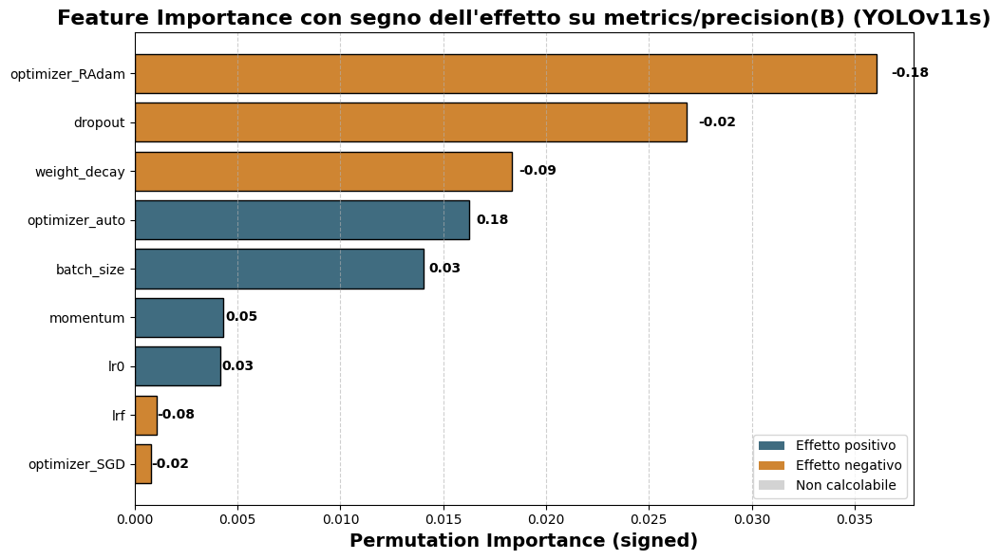

,feature,importance,std,effect_corr
7,optimizer_SGD,0.000773,0.0,-0.020243
3,lrf,0.001072,0.0,-0.079118
2,lr0,0.004160,0.0,0.027372
4,momentum,0.004313,0.0,0.048444
0,batch_size,0.014024,0.0,0.025836
8,optimizer_auto,0.016257,0.0,0.180059
5,weight_decay,0.018320,0.0,-0.091111
1,dropout,0.026844,0.0,-0.022866
6,optimizer_RAdam,0.036069,0.0,-0.182039


In [96]:
plot_permutation_fi_signed(df, model_name='YOLOv11s', target_col='metrics/precision(B)', n_repeats=10)

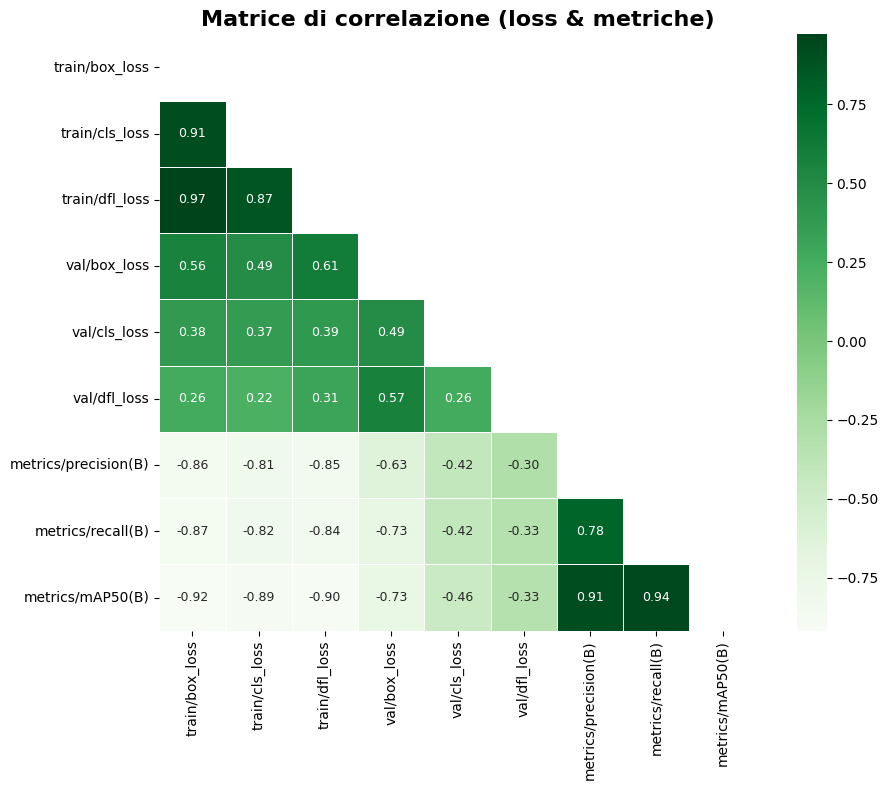

In [107]:
def plot_corr_matrix(df, variables=None, figsize=(10,8), cmap="coolwarm"):
    """
    Plotta la matrice di correlazione triangolare tra variabili di loss e metriche.
    
    Args:
        df (pd.DataFrame): dataframe con le colonne delle metriche/loss.
        variables (list, optional): lista di variabili da includere. Se None, usa default (9 variabili).
        figsize (tuple): dimensione figura.
        cmap (str): colormap della heatmap.
    """
    if variables is None:
        variables = [
            "train/box_loss", "train/cls_loss", "train/dfl_loss",
            "val/box_loss", "val/cls_loss", "val/dfl_loss",
            "metrics/precision(B)", "metrics/recall(B)", "metrics/mAP50(B)"
            # se vuoi 10 variabili, aggiungi anche "metrics/f1(B)"
        ]
    
    corr = df[variables].corr()

    # Maschera triangolare
    mask = np.triu(np.ones_like(corr, dtype=bool))

    # Plot
    plt.figure(figsize=figsize)
    sns.heatmap(corr, mask=mask, annot=True, fmt=".2f", cmap=cmap,
                cbar=True, square=True, linewidths=.5,
                annot_kws={"size": 9})
    plt.title("Matrice di correlazione (loss & metriche)", fontsize=16, fontweight="bold")
    plt.tight_layout()
    plt.show()

# --- Uso ---
plot_corr_matrix(df, cmap='Greens')

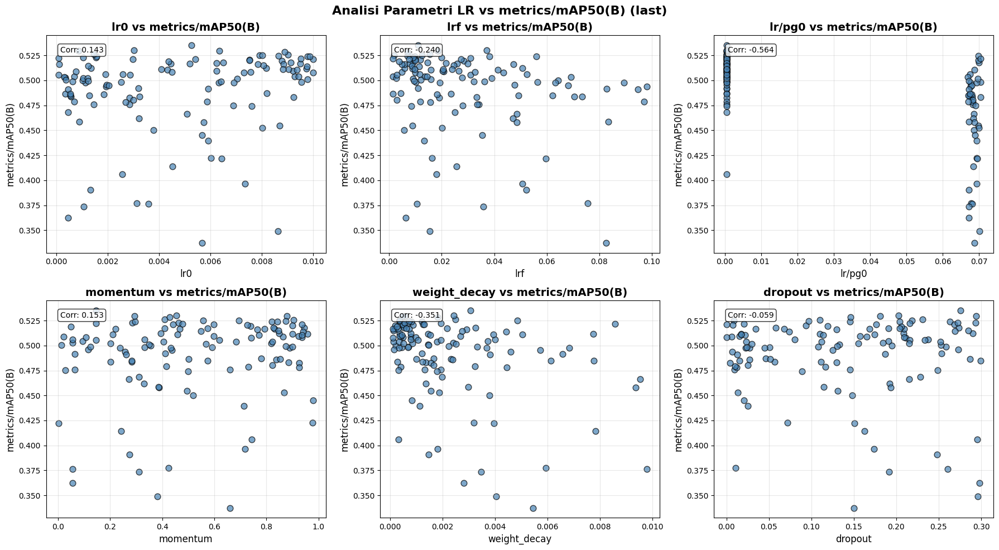

In [109]:
def plot_lr_param_analysis(df, metric, mode="last", score_col="composite_score"):
    """
    Scatterplot dei parametri di learning rate vs una metrica scelta.
    Ogni pallino = un run (media sui fold).
    
    Args:
        df (pd.DataFrame): dataframe con colonne parametri, metriche e run/fold.
        metric (str): colonna metrica da analizzare.
        mode (str): "last", "max", "min" → come aggregare sui fold.
        score_col (str): colonna per colorare i punti (default = composite_score).
    """
    lr_params = ['lr0', 'lrf', 'lr/pg0', 'momentum', 'weight_decay', 'dropout']
    available_lr_params = [p for p in lr_params if p in df.columns]
    if not available_lr_params:
        raise ValueError("Nessun parametro LR disponibile nel dataframe.")

    # --- Aggregazione: run = media dei fold ---
    grouped = []
    for (run, model), d in df.groupby(["run_code", "model"]):
        fold_vals = []
        for fold, fd in d.groupby("fold_number"):
            vals = fd[metric].dropna()
            if vals.empty:
                continue
            if mode == "last":
                fold_vals.append(vals.iloc[-1])
            elif mode == "max":
                fold_vals.append(vals.max())
            elif mode == "min":
                fold_vals.append(vals.min())
            else:
                raise ValueError("mode deve essere 'last', 'max' o 'min'")
        if fold_vals:
            row = d.iloc[0][available_lr_params + ([score_col] if score_col in d.columns else [])].to_dict()
            row.update({"run_code": run, "model": model, "score": np.mean(fold_vals)})
            grouped.append(row)

    df_runs = pd.DataFrame(grouped)
    if df_runs.empty:
        raise ValueError("Nessun run valido trovato per i parametri e la metrica selezionata.")

    # --- Plot ---
    n = len(available_lr_params)
    nrows, ncols = 2, int(np.ceil(n/2))
    fig, axes = plt.subplots(nrows, ncols, figsize=(6*ncols, 5*nrows))
    axes = axes.flatten()

    for i, param in enumerate(available_lr_params):
        ax = axes[i]
        colors = df_runs[score_col] if score_col in df_runs else "steelblue"

        sc = ax.scatter(
            df_runs[param], df_runs["score"],
            alpha=0.7, c=colors,
            cmap="viridis" if score_col in df_runs else None,
            s=60, edgecolor="black"
        )
        ax.set_xlabel(param, fontsize=12)
        ax.set_ylabel(metric, fontsize=12)
        ax.set_title(f"{param} vs {metric}", fontsize=14, fontweight="bold")
        ax.grid(alpha=0.3)

        # Correlazione Pearson
        if pd.api.types.is_numeric_dtype(df_runs[param]):
            corr = df_runs[param].corr(df_runs["score"])
            ax.text(
                0.05, 0.95, f"Corr: {corr:.3f}",
                transform=ax.transAxes,
                bbox=dict(boxstyle="round", facecolor="white", alpha=0.8),
                ha="left", va="top"
            )

    # Colormap legend se disponibile
    if score_col in df_runs:
        cbar = fig.colorbar(sc, ax=axes[:n], shrink=0.6)
        cbar.set_label(score_col, fontsize=12, fontweight="bold")

    fig.suptitle(f"Analisi Parametri LR vs {metric} ({mode})", fontsize=16, fontweight="bold")
    plt.tight_layout()
    plt.show()

    return df_runs

df_runs = plot_lr_param_analysis(
    df, 
    metric="metrics/mAP50(B)", 
    mode="last", 
    score_col="composite_score"
)